# **Exploratory data analyses & statistical validation in preparation for DGE analysis**

## **Content**
### 1. Exploratory PCAs on TPM counts: 4 combinations
### 2. UMAP
### 3. PCA on ELC on filtered TPM
### 4. Library size & log10 counts boxplot
### 5. Normalization with DeSeq2 / r-sleuth package
### 6. Confirming normalization efficiency with PCAs on TPM counts
### 7. Pearson's correlation matrix
### 8. Build comparism figures

In [78]:
library(DESeq2, warn.conflicts = FALSE)
library(sleuth, warn.conflicts = FALSE)
library(plyr, warn.conflicts = FALSE)
library(tidyverse, warn.conflicts = FALSE)
library(cowplot, warn.conflicts = FALSE)
library(patchwork, warn.conflicts = FALSE)
library(vsn, warn.conflicts = FALSE)
library(hexbin, warn.conflicts = FALSE)
library(FactoMineR, warn.conflicts = FALSE)
library(factoextra, warn.conflicts = FALSE)
library(edgeR, warn.conflicts = FALSE)
library(RColorBrewer, warn.conflicts = FALSE)
library(umap, warn.conflicts = FALSE)
library(ggsci, warn.conflicts = FALSE)
library(svglite, warn.conflicts = FALSE)
library(viridis, warn.conflicts = FALSE)
library(corrplot, warn.conflicts = FALSE)
theme_set(theme_bw())

In [2]:
set.seed(42) # For reproducibility of results

In [3]:
# import count table
setwd("/nfs/pgsb/projects/comparative_triticeae/phenotype/flower_development/refsets/triticum/")
hord <- readRDS("wheat_count_table_merged.rds")
h <- hord$counts
dim(h)
head(h)
# dimensions shows that a total of 215 samples were mapped to 123 075 genes of T.aestivum

[1] 123075    215

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
TraesCHI1A01G000100,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.0000,⋯,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000200,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.0000,⋯,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000300,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.0000,⋯,6.0000,7.878112,14.0000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000400,0.0000,0.000000,0.0000,4.893036,4.726423,1.938802,0.0000,0.000000,0.0000,0.0000,⋯,140.5432,108.839845,177.3651,112.3966,1.993108,0.000000,0.000000,0.000000,2.004102,0.000000
TraesCHI1A01G000500,1.0000,8.000000,7.0000,9.000000,2.000000,3.000000,1.0000,8.000000,7.0000,9.0000,⋯,5.0000,11.000000,12.0000,5.0000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000600,193.3952,2.465932,159.4838,51.088736,8.853329,80.785644,193.3877,2.465675,159.5168,126.3058,⋯,387.2507,513.135328,458.2691,355.3096,0.000000,2.649372,1.307648,4.297154,4.083578,1.356089


In [4]:
# import metadata
setwd("/home/vanda.marosi/floral_development_thesis_vm/datatables/")
# stringsAsfactors has to be truse for deseq2 design
wheat_metadata <- read.table("wheat_final.csv", header = TRUE, sep = ",", stringsAsFactors = TRUE)
wheat_meta <- select(wheat_metadata, Run.ID, Dataset, Batch, Cultivar, GM, Zadok_scale, Intermediate_age, High_level_age, Intermediate_tissue, High_level_tissue, Treatment, RNA_extraction, RNA_enrichment, RNA_input..microg., PCR_purification, Growth_condition, Day_night_condition, Temperature_day_night_c, Growth_location, Seq_location, Instrument, Library.layout)
colnames(wheat_meta) <- c("ID", "dataset", "batch", "cultivar", "gm", "zadoc_scale", "intermediate_age", "high_level_age", "intermediate_tissue", "high_level_tissue", "treatment", "rna_extraction", "rna_enrichment", "rna_input", "pcr_purification", "growth_condition", "day_night", "temp", "growth_location", "seq_location", "instrument", "library")
# add rownames for deseq2 to identify rows with count-columns
rownames(wheat_meta) <- wheat_meta$ID
glimpse(wheat_meta)
tail(wheat_meta)

Rows: 215
Columns: 22
$ ID                  <fct> SRR10737427, SRR10737428, SRR10737429, SRR1073743…
$ dataset             <fct> cytoplasmic_male_sterility, cytoplasmic_male_ster…
$ batch               <int> 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6…
$ cultivar            <fct> 303-B, 303-B, 303-B, C303A, C303A, C303A, B706, B…
$ gm                  <fct> wt, wt, wt, mut, mut, mut, wt, wt, wt, mut, mut, …
$ zadoc_scale         <int> 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 5…
$ intermediate_age    <fct> Heading, Heading, Heading, Heading, Heading, Head…
$ high_level_age      <fct> Reproductive, Reproductive, Reproductive, Reprodu…
$ intermediate_tissue <fct> anther, anther, anther, anther, anther, anther, a…
$ high_level_tissue   <fct> inflorescence, inflorescence, inflorescence, infl…
$ treatment           <fct> control, control, control, mutant, mutant, mutant…
$ rna_extraction      <fct> trizol, trizol, trizol, trizol, trizol, trizol, R…
$ rna_enrichment      <fct> ol

,ID,dataset,batch,cultivar,gm,zadoc_scale,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,seq_location,instrument,library
,<fct>,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
SRR5186313,SRR5186313,chlorophyll_deficiency,89,Jimai5265,wt,21,Tillering,Vegetative,leaf,leaf,⋯,unknown,unknown,unknown,field,natural,natural,China_Northwest_University,China,Illumina HiSeq 2500,paired
SRR5186364,SRR5186364,chlorophyll_deficiency,89,Jimai5265,wt,21,Tillering,Vegetative,leaf,leaf,⋯,unknown,unknown,unknown,field,natural,natural,China_Northwest_University,China,Illumina HiSeq 2500,paired
SRR5186375,SRR5186375,chlorophyll_deficiency,89,Jimai5265,wt,21,Tillering,Vegetative,leaf,leaf,⋯,unknown,unknown,unknown,field,natural,natural,China_Northwest_University,China,Illumina HiSeq 2500,paired
SRR5186382,SRR5186382,chlorophyll_deficiency,90,Jimai5265,mut,21,Tillering,Vegetative,leaf,leaf,⋯,unknown,unknown,unknown,field,natural,natural,China_Northwest_University,China,Illumina HiSeq 2500,paired
SRR5186387,SRR5186387,chlorophyll_deficiency,90,Jimai5265,mut,21,Tillering,Vegetative,leaf,leaf,⋯,unknown,unknown,unknown,field,natural,natural,China_Northwest_University,China,Illumina HiSeq 2500,paired
SRR5186416,SRR5186416,chlorophyll_deficiency,90,Jimai5265,mut,21,Tillering,Vegetative,leaf,leaf,⋯,unknown,unknown,unknown,field,natural,natural,China_Northwest_University,China,Illumina HiSeq 2500,paired


### Subsetting categorical variables: 
* **technical variables:** "ID", "dataset", "batch", "rna_extraction", "rna_enrichment", "rna_input", "pcr_purification", "growth_condition", "day_night", "temp", "growth_location", "seq_location", "instrument", "library"
* **biological variables:** "cultivar", "gm", "treatment", "zadoc_scale", "intermediate_age", "high_level_age", "intermediate_tissue", "high_level_tissue",

In [5]:
# separate technical variables from metadata
wheat_tech_meta <- select(wheat_meta, ID, dataset, batch, rna_extraction, rna_enrichment, rna_input, pcr_purification, growth_condition, day_night, temp, growth_location, seq_location, instrument, library)

In [6]:
# separate biological variables from metadata
wheat_bio_meta <- select(wheat_meta, ID, dataset, cultivar, gm, treatment, zadoc_scale, intermediate_age, high_level_age, intermediate_tissue, high_level_tissue)

In [7]:
# mixed most important variables from metadata
wheat_mix_meta <- select(wheat_meta, ID, dataset, cultivar, instrument, library, gm, growth_condition, intermediate_age, high_level_age, intermediate_tissue, high_level_tissue)

# 1. Exploratory analysis with PCAs
* in my exploratory analysis unscaled PCAs are performed using raw and filtered & log10-transformed count tables to see the effect of batches and other different technical variables that can be used for the model of variance stabilization

## 1.1 PCA on raw TPM counts without filtering using `FactoMineR` and `factoextra`

In [8]:
dim(h)
# switching rows to columns
cnt <- t(h)
cnt <- as.data.frame(cnt, stringsAsFactors = TRUE)
# adding rownames=ID as a column
cnt <- cbind(ID = rownames(cnt), cnt)
rownames(cnt) <- cnt$ID
dim(cnt)
head(cnt)

[1] 123075    215

[1]    215 123076

,ID,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,⋯,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200,TraesCHIUn01G316300
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,0,0,0,0.000000,1,193.395199,79.129559,26.435908,2.193419e+03,⋯,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0,0
SRR10737428,SRR10737428,0,0,0,0.000000,8,2.465932,3.067772,0.000000,3.662236e+01,⋯,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0,0
SRR10737429,SRR10737429,0,0,0,0.000000,7,159.483818,32.490120,11.197569,5.408272e+02,⋯,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0,0
SRR10737430,SRR10737430,0,0,0,4.893036,9,51.088736,25.418376,4.077583,4.440473e+02,⋯,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0,0
SRR10737431,SRR10737431,0,0,0,4.726423,2,8.853329,3.074076,3.075350,9.848208e-03,⋯,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0,0
SRR10737432,SRR10737432,0,0,0,1.938802,3,80.785644,12.144357,12.185342,7.142632e+02,⋯,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0,0


In [9]:
# include metadata table
cnt_meta <- inner_join(wheat_tech_meta, cnt, by = "ID")
# add rownames again
rownames(cnt_meta) <- cnt_meta$ID
dim(cnt_meta)
head(cnt_meta)

[1]    215 123089

,ID,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,⋯,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200,TraesCHIUn01G316300
,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0,0
SRR10737428,SRR10737428,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0,0
SRR10737429,SRR10737429,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0,0
SRR10737430,SRR10737430,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0,0
SRR10737431,SRR10737431,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0,0
SRR10737432,SRR10737432,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0,0


#### Prepare dataset for `FactoMineR`
* check on classes
* to deal with missing values:

By default, missing values in FactoMineR are replaced by the mean of each variable which is not a very proper and convenient way to deal with missing values, especially when there are a lot of them in your dataset. We have implemented a package missMDA to deal with missing values in PCA, in CA, in MCA, in FAMD, and in MFA.

In [10]:
# convert variables which are not factor into factor that they could be part of pca
cnt_meta$rna_input<-factor(cnt_meta$rna_input)
cnt_meta$batch<-factor(cnt_meta$batch)
class(cnt_meta$rna_input)
class(cnt_meta$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_meta <- droplevels(cnt_meta)
# delete ID column to not have it as extra supplementary variable
cnt_meta <- select(cnt_meta, -ID)
head(cnt_meta)

[1] "factor"

[1] "factor"

,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,⋯,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200,TraesCHIUn01G316300
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0,0
SRR10737428,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0,0
SRR10737429,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0,0
SRR10737430,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0,0
SRR10737431,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0,0
SRR10737432,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0,0


In [11]:
# create classes to check on class types -> pca can handle supplementary variables only as factors!
classes <- sapply(X = cnt_meta, FUN = class)
table(classes)
which(classes == 'factor')
# it is important to define NAs for missing values and check on factor levels! do this once in the analysis
#table(cnt_meta$dataset, useNA = "always") and so on..

classes
 factor numeric 
     13  123075 

dataset            batch   rna_extraction   rna_enrichment 
               1                2                3                4 
       rna_input pcr_purification growth_condition        day_night 
               5                6                7                8 
            temp  growth_location     seq_location       instrument 
               9               10               11               12 
         library 
              13

# 1.1 UNscaled PCA on raw & not-filtered TPM counts

In [12]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
raw_pca <- PCA(X = cnt_meta, scale.unit = FALSE, ncp = 4, quali.sup = c(1:13), graph = F)
#summary(raw_pca)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,211693231288,55.493763,55.49376
comp 2,48311388550,12.664461,68.15822
comp 3,24463536838,6.412929,74.57115
comp 4,21159936335,5.546916,80.11807
comp 5,16850474768,4.417223,84.53529
comp 6,10810138339,2.833795,87.36909


Too few points to calculate an ellipse


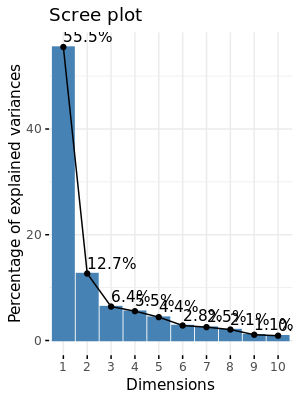

Too few points to calculate an ellipse


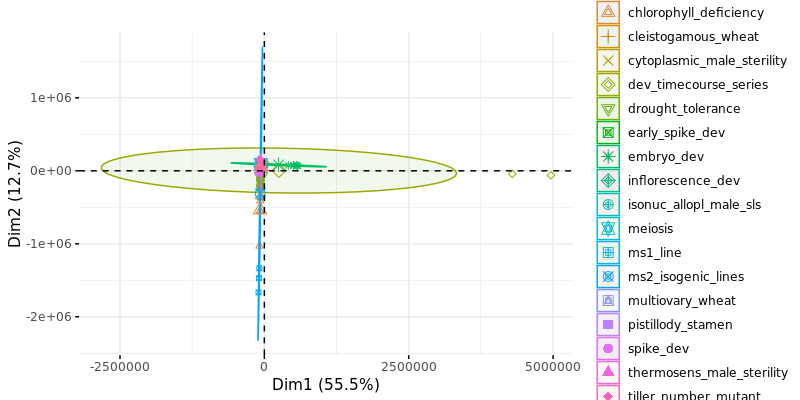

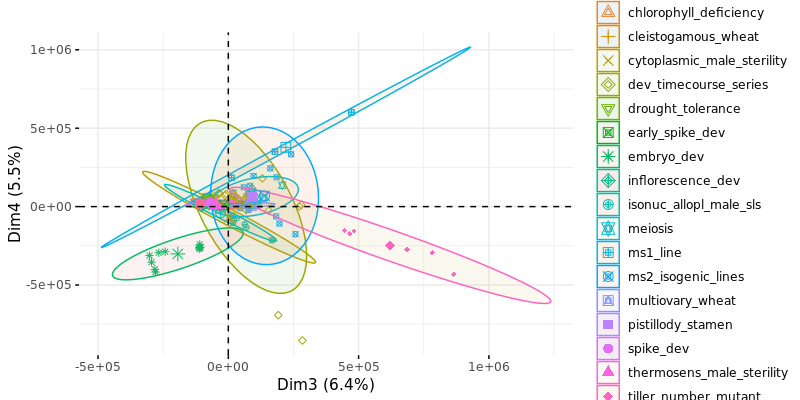

In [100]:
options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(raw_pca$eig)
# display scree plot
fviz_eig(raw_pca, addlabels = TRUE)
# display individuals (samples) colored by technical variable
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
colourCount = length(unique(cnt_meta$dataset))
getPalette = colorRampPalette(brewer.pal(12, "Paired"))
fviz_pca_ind(X = raw_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = raw_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(3, 4), habillage = cnt_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

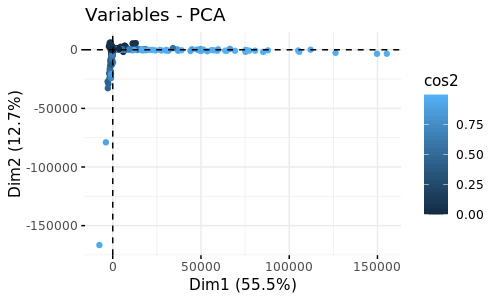

In [14]:
# display variables (genes) colored by quality
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)
fviz_pca_var(X = raw_pca, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.2 **Scaled & centered** PCA on raw & not-filtered TPM counts

In [15]:
# scaling and centering data
dim(h)
cnt <- as.data.frame(h, stringsAsFactors = FALSE)
# filter out zero variance genes that would cause a problem for scaling and centering
filter_cnt <- cnt[(rowSums(cnt)>0), ]
#filter_cnt <- filter_cnt+1
dim(filter_cnt)
# switching columns to rows
switched_cnt_df <- t(filter_cnt)
# scaling and centering
cnt_scaled <- scale(switched_cnt_df, center = TRUE, scale = TRUE)
cnt_scaled <- cnt_scaled+1
# adding rownames=ID as a column
cnt_scaled <- as.data.frame(cnt_scaled, stringsAsFactors = TRUE)
cnt_scaled <- cbind(ID = rownames(cnt_scaled), cnt_scaled)
rownames(cnt_scaled) <- cnt_scaled$ID
dim(cnt_scaled)
head(cnt_scaled)

[1] 123075    215

[1] 122215    215

[1]    215 122216

,ID,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,0.4354688,0.69979,0.5344954,0.2968663,0.5848934,3.0253862,2.8132309,3.7549519,1.3352236,⋯,0.861155,0.3402905,5.2559016,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,6.0143314,0.8594249
SRR10737428,SRR10737428,0.4354688,0.69979,0.5344954,0.2968663,0.9095363,0.7100325,0.7928288,0.6387408,0.8377439,⋯,0.861155,0.3398830,3.7280886,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,5.8560034,0.8594249
SRR10737429,SRR10737429,0.4354688,0.69979,0.5344954,0.2968663,0.8631588,2.6141510,1.5743641,1.9586876,0.9540422,⋯,0.861155,0.3399994,3.0662585,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,3.2222391,0.8594249
SRR10737430,SRR10737430,0.4354688,0.69979,0.5344954,0.3525576,0.9559139,1.2996697,1.3865199,1.1193979,0.9317192,⋯,0.861155,0.4048485,0.7317902,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6964605,0.8594249
SRR10737431,SRR10737431,0.4354688,0.69979,0.5344954,0.3506613,0.6312710,0.7874909,0.7929963,1.0012569,0.8292990,⋯,0.861155,0.3836008,0.7367206,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6985189,0.8594249
SRR10737432,SRR10737432,0.4354688,0.69979,0.5344954,0.3189333,0.6776486,1.6597970,1.0339269,2.0751242,0.9940464,⋯,0.861155,0.3624114,0.7317902,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6954313,0.8594249


In [16]:
# include metadata table
cnt_meta_scaled <- inner_join(wheat_tech_meta, cnt_scaled, by = "ID")
# add rownames again
rownames(cnt_meta_scaled) <- cnt_meta_scaled$ID
dim(cnt_meta_scaled)
head(cnt_meta_scaled)

[1]    215 122229

,ID,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.861155,0.3402905,5.2559016,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,6.0143314,0.8594249
SRR10737428,SRR10737428,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.861155,0.3398830,3.7280886,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,5.8560034,0.8594249
SRR10737429,SRR10737429,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.861155,0.3399994,3.0662585,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,3.2222391,0.8594249
SRR10737430,SRR10737430,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.861155,0.4048485,0.7317902,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6964605,0.8594249
SRR10737431,SRR10737431,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.861155,0.3836008,0.7367206,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6985189,0.8594249
SRR10737432,SRR10737432,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.861155,0.3624114,0.7317902,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6954313,0.8594249


In [17]:
# convert variables which are not factor into factor that they could be part of pca
cnt_meta_scaled$rna_input<-factor(cnt_meta_scaled$rna_input)
cnt_meta_scaled$batch<-factor(cnt_meta_scaled$batch)
class(cnt_meta_scaled$rna_input)
class(cnt_meta_scaled$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_meta_scaled <- droplevels(cnt_meta_scaled)
# delete ID column to not have it as extra supplementary variable
cnt_meta_scaled <- select(cnt_meta_scaled, -ID)
head(cnt_meta_scaled)

[1] "factor"

[1] "factor"

,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.861155,0.3402905,5.2559016,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,6.0143314,0.8594249
SRR10737428,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.861155,0.3398830,3.7280886,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,5.8560034,0.8594249
SRR10737429,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.861155,0.3399994,3.0662585,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,3.2222391,0.8594249
SRR10737430,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.861155,0.4048485,0.7317902,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6964605,0.8594249
SRR10737431,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.861155,0.3836008,0.7367206,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6985189,0.8594249
SRR10737432,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.861155,0.3624114,0.7317902,0.6768253,0.1848144,0.3229783,0.6826557,0.852135,0.6954313,0.8594249


In [18]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 100)
raw_pca_scaled <- PCA(X = cnt_meta_scaled, scale.unit = FALSE, ncp = 4, quali.sup = c(1:13), graph = F)
#summary(raw_pca_scaled)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,26578.096,21.848621,21.84862
comp 2,11499.706,9.453376,31.30200
comp 3,8381.530,6.890068,38.19206
comp 4,5682.448,4.671277,42.86334
comp 5,5264.893,4.328025,47.19137
comp 6,4544.170,3.735552,50.92692


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”Too few points to calculate an ellipse


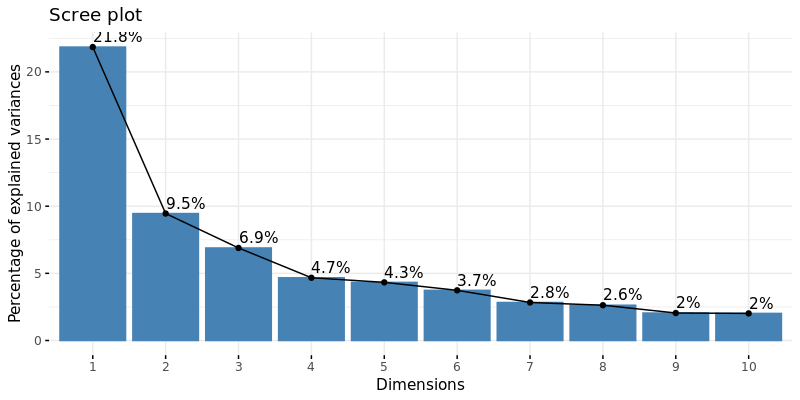

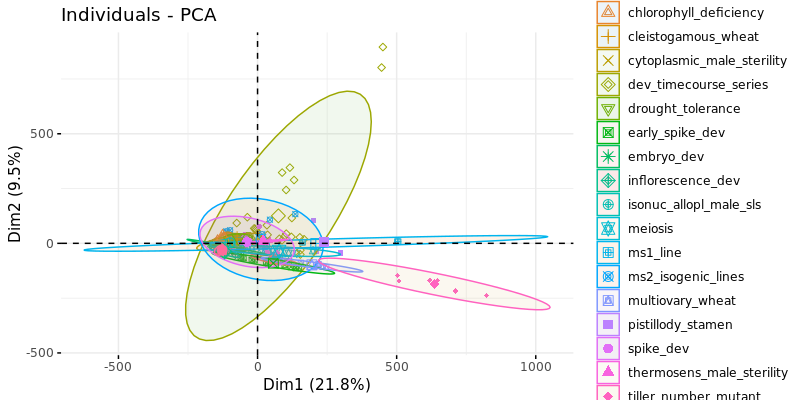

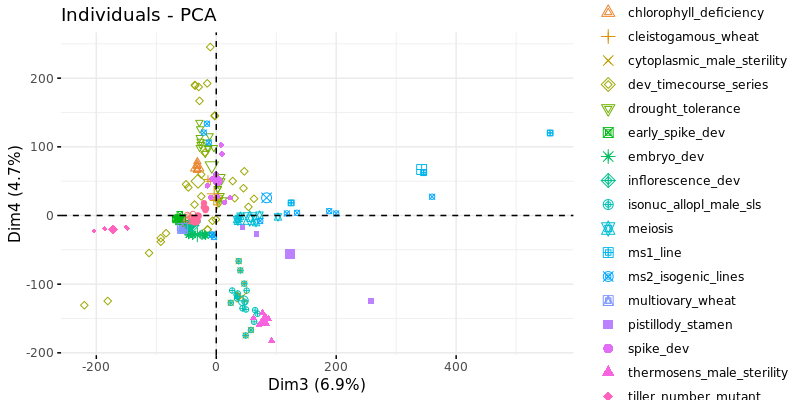

In [19]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(raw_pca_scaled$eig)
# display scree plot
fviz_eig(raw_pca_scaled, addlabels = TRUE)
# display individuals (samples) colored by technical variable
colourCount = length(unique(cnt_meta_scaled$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = raw_pca_scaled, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_meta_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = raw_pca_scaled, label = "none", labelsize = 0.4, legend.title = "Datasets", axes = c(3, 4), habillage = cnt_meta_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

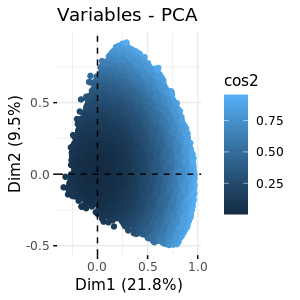

In [20]:
# display variables (genes) colored by quality
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
fviz_pca_var(X = raw_pca_scaled, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.3. PCA on filtered & log2-transformed TPM counts
### 1.3.1 Filtering out ribosomal-mitochondrial-chloroplast genes to avoid their overrepresentation:
These genes were by default not present in the reference transcriptomes.
Daniel's practice is to filter for: human genome, E.coli, common (wheat) pathogens such as Fusarium, Pseudomonas, Xanthomonas, mitochondrial-ribosomal-chloroplast genes
### 1.3.2 Filter out all genes that have no reads in any of the experiments:

In [21]:
filter_cnt <- h[(rowSums(h)>0), ]
dim(filter_cnt)
# dimensions shows that my 180 samples are successfully mapped with exisiting transcripts to 122 025 genes of T.aestivum

[1] 122215    215

### 1.3.3 Filtering to remove lowly expressed genes
* source: https://combine-australia.github.io/RNAseq-R/06-rnaseq-day1.html

Genes with very low counts across all libraries provide little evidence for differential expression and they interfere with some of the statistical approximations that are used later in the pipeline. They also add to the multiple testing burden when estimating false discovery rates, reducing power to detect differentially expressed genes. These genes should be filtered out prior to further analysis.

When there are biological replicates in each group, in this case we have a minimum sample size of 2 in each group, so we favour filtering on a minimum transcripts per million threshold present in at least 2 samples. We choose to retain genes if they are expressed at a transcripts-per-million (TPM) above 0.5 in at least 2 samples.

* **how to choose ideal cutoff (from above mentioned source):** A TPM of 0.5 is used as it corresponds to a count of 10-15 for the library sizes in this data set. If the count is any smaller, it is considered to be very low, indicating that the associated gene is not expressed in that sample. A requirement for expression in two or more libraries is used as each group contains two replicates. This ensures that a gene will be retained if it is only expressed in one group. Smaller TPM thresholds are usually appropriate for larger libraries. As a general rule, a good threshold can be chosen by identifying the TPM that corresponds to a count of 10, which in this case is about 0.5. You should filter with TPMs rather than filtering on the counts directly, as the latter does not account for differences in library sizes between samples.

In [22]:
# which value in my TPMs are greater than 0.5?
thresh <- filter_cnt >= 0.5
# this gives a logical matrix
head(thresh)

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
TraesCHI1A01G000100,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
TraesCHI1A01G000200,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
TraesCHI1A01G000300,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
TraesCHI1A01G000400,FALSE,FALSE,FALSE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,FALSE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,FALSE,FALSE,TRUE,FALSE
TraesCHI1A01G000500,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,TRUE,FALSE,TRUE,FALSE,FALSE,FALSE
TraesCHI1A01G000600,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,TRUE,⋯,TRUE,TRUE,TRUE,TRUE,FALSE,TRUE,TRUE,TRUE,TRUE,TRUE


In [23]:
# summary of how many TRUEs are in each row
tail(table(rowSums(thresh)))
# there are 12 470 genes that have TRUEs in all 240 samples


  210   211   212   213   214   215 
 1136  1201  1558  2071  3013 31294 

In [24]:
# we would like to keep genes that have at least 2 TRUEs in each row of thresh
keep <- rowSums(thresh) >= 2
summary(keep)

   Mode   FALSE    TRUE 
logical    1918  120297 

In [25]:
# subset the rows of countdata to keep the more highly expressed genes
bcp_filtered <- filter_cnt[keep,]
dim(bcp_filtered)

[1] 120297    215

### 1.3.5 Log2 transform

In [26]:
cnt_log2 <- log2(bcp_filtered+1)
head(cnt_log2)

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
TraesCHI1A01G000100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,⋯,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,⋯,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,⋯,2.807355,3.150253,3.906891,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000400,0.000000,0.000000,0.000000,2.559011,2.517634,1.555228,0.000000,0.000000,0.00000,0.000000,⋯,7.145099,6.779258,7.478690,6.825234,1.581644,0.000000,0.000000,0.000000,1.586934,0.000000
TraesCHI1A01G000500,1.000000,3.169925,3.000000,3.321928,1.584963,2.000000,1.000000,3.169925,3.00000,3.321928,⋯,2.584963,3.584963,3.700440,2.584963,1.000000,0.000000,1.584963,0.000000,0.000000,0.000000
TraesCHI1A01G000600,7.602849,1.793243,7.326284,5.702900,3.300611,6.353776,7.602793,1.793136,7.32658,6.992154,⋯,8.600845,9.006004,8.843196,8.476988,0.000000,1.867648,1.206423,2.405218,2.345844,1.236394


### 1.3.6 Preparation for PCA with log2 & filtered counts

In [27]:
# switching rows to columns
cnt_log <- t(cnt_log2)
cnt_log <- as.data.frame(cnt_log, stringsAsFactors = TRUE)
# adding rownames=ID as a column
cnt_log <- cbind(ID = rownames(cnt_log), cnt_log)
rownames(cnt_log) <- cnt_log$ID
dim(cnt_log)
head(cnt_log)
# wheat_tech_meta has technical variables

[1]    215 120298

,ID,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,0,0,0,0.000000,1.000000,7.602849,6.324263,4.777993,11.09962351,⋯,0,2.222392,9.843288,0,0.000000e+00,0,0,0,12.33567,0
SRR10737428,SRR10737428,0,0,0,0.000000,3.169925,1.793243,2.024239,0.000000,5.23351862,⋯,0,1.222392,9.249635,0,4.998564e-08,0,0,0,12.29208,0
SRR10737429,SRR10737429,0,0,0,0.000000,3.000000,7.326284,5.065664,3.608522,9.08168901,⋯,0,1.584963,8.890220,0,0.000000e+00,0,0,0,11.26217,0
SRR10737430,SRR10737430,0,0,0,2.559011,3.321928,5.702900,4.723470,2.344142,8.79781483,⋯,0,8.548180,0.000000,0,6.687401e-07,0,0,0,1.00000,0
SRR10737431,SRR10737431,0,0,0,2.517634,1.584963,3.300611,2.026473,2.026924,0.01413845,⋯,0,7.981092,1.000000,0,0.000000e+00,0,0,0,2.00000,0
SRR10737432,SRR10737432,0,0,0,1.555228,2.000000,6.353776,3.716372,3.720863,9.48233048,⋯,0,7.037089,0.000000,0,0.000000e+00,0,0,0,0.00000,0


In [28]:
# include metadata table
cnt_log_meta <- inner_join(wheat_mix_meta, cnt_log, by = "ID")
# add rownames again
rownames(cnt_log_meta) <- cnt_log_meta$ID
dim(cnt_log_meta)
head(cnt_log_meta)

[1]    215 120308

,ID,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,⋯,0,2.222392,9.843288,0,0.000000e+00,0,0,0,12.33567,0
SRR10737428,SRR10737428,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,⋯,0,1.222392,9.249635,0,4.998564e-08,0,0,0,12.29208,0
SRR10737429,SRR10737429,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,⋯,0,1.584963,8.890220,0,0.000000e+00,0,0,0,11.26217,0
SRR10737430,SRR10737430,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,⋯,0,8.548180,0.000000,0,6.687401e-07,0,0,0,1.00000,0
SRR10737431,SRR10737431,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,⋯,0,7.981092,1.000000,0,0.000000e+00,0,0,0,2.00000,0
SRR10737432,SRR10737432,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,⋯,0,7.037089,0.000000,0,0.000000e+00,0,0,0,0.00000,0


In [29]:
# convert variables which are not factor into factor that they could be part of pca
#cnt_log_meta$rna_input<-factor(cnt_log_meta$rna_input)
#cnt_log_meta$batch<-factor(cnt_log_meta$batch)
#class(cnt_log_meta$rna_input)
#class(cnt_log_meta$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_log_meta <- droplevels(cnt_log_meta)
# delete ID column to not have it as extra supplementary variable
cnt_log_meta <- select(cnt_log_meta, -ID)
head(cnt_log_meta)

,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,⋯,0,2.222392,9.843288,0,0.000000e+00,0,0,0,12.33567,0
SRR10737428,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,⋯,0,1.222392,9.249635,0,4.998564e-08,0,0,0,12.29208,0
SRR10737429,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,⋯,0,1.584963,8.890220,0,0.000000e+00,0,0,0,11.26217,0
SRR10737430,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,⋯,0,8.548180,0.000000,0,6.687401e-07,0,0,0,1.00000,0
SRR10737431,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,⋯,0,7.981092,1.000000,0,0.000000e+00,0,0,0,2.00000,0
SRR10737432,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,⋯,0,7.037089,0.000000,0,0.000000e+00,0,0,0,0.00000,0


In [30]:
# create classes to check on class types -> pca can handle supplementary variables only as factors!
classes2 <- sapply(X = cnt_log_meta, FUN = class)
table(classes2)
which(classes2 == 'factor')

classes2
 factor numeric 
     10  120297 

dataset            cultivar          instrument             library 
                  1                   2                   3                   4 
                 gm    growth_condition    intermediate_age      high_level_age 
                  5                   6                   7                   8 
intermediate_tissue   high_level_tissue 
                  9                  10

# 1.3.7 **Un-scaled** PCA on log2-transformed & filtered TPM counts

In [31]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 100)
log2_pca <- PCA(X = cnt_log_meta, scale.unit = FALSE, ncp = 4, quali.sup = c(1:10), graph = F)
#summary(log2_pca)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,59367.52,17.931550,17.93155
comp 2,53128.26,16.047024,33.97857
comp 3,38236.65,11.549118,45.52769
comp 4,24156.51,7.296309,52.82400
comp 5,16277.89,4.916624,57.74063
comp 6,14909.11,4.503194,62.24382


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”Too few points to calculate an ellipse


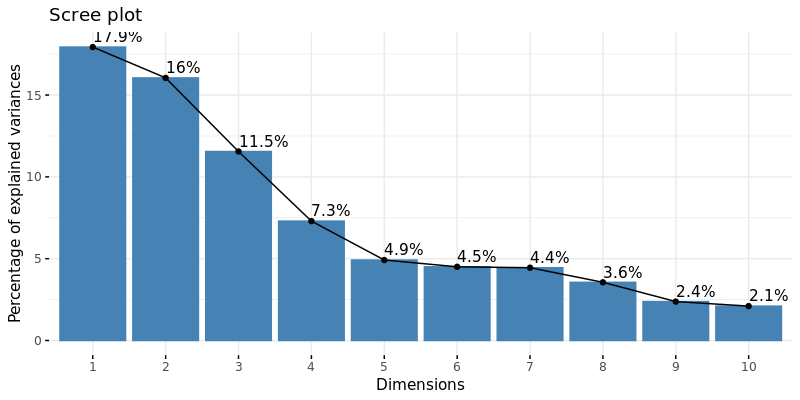

Too few points to calculate an ellipse


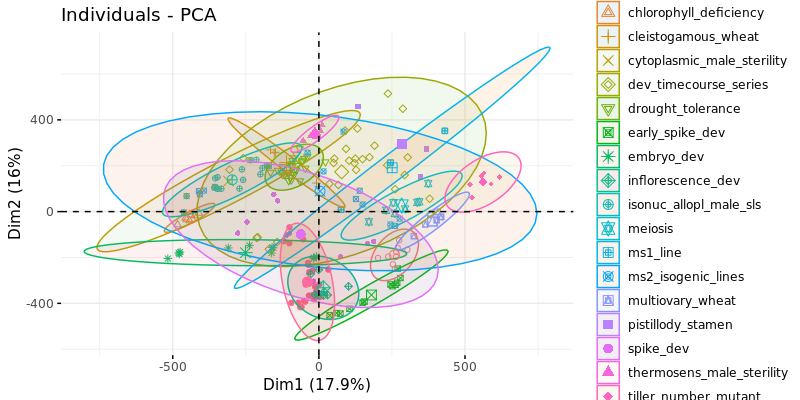

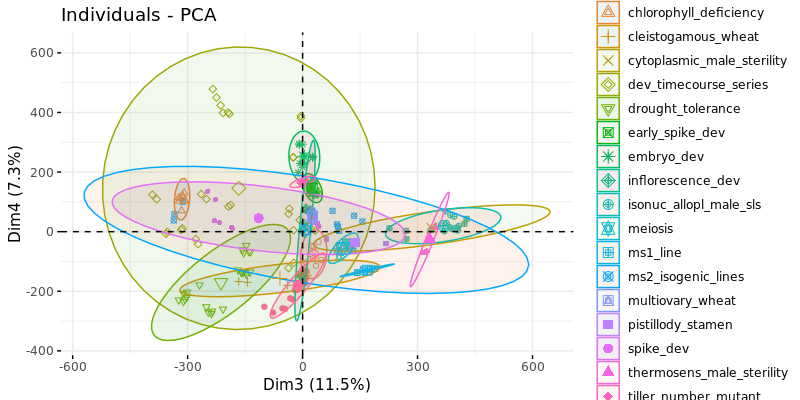

In [32]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(log2_pca$eig)
# display scree plot
fviz_eig(log2_pca, addlabels = TRUE)
# display individuals (samples) colored by technical variable
colourCount = length(unique(cnt_log_meta$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = log2_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = log2_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(3, 4), habillage = cnt_log_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

In [154]:
# build comparism plot variables
nb.cols <- 19
mycolors <- colorRampPalette(brewer.pal(12, "Paired"))(nb.cols)

a1 <- fviz_pca_ind(X = log2_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_colour_manual(values = mycolors, name = "Datasets ",
                           labels = c("Awn development", "Chlorophyll deficiency  ", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
        scale_shape_manual(name = "Datasets ",
                           labels = c("Awn development", "Chlorophyll deficiency  ", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

a2 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Library type", title = "", addEllipses = TRUE, habillage = cnt_log_meta$library) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type  ", labels = c("Paired read  ", "Single read")) +
        scale_shape_manual(name = "Library type  ", labels = c("Paired read  ", "Single read"), 
                      values = c(15, 16)) +
        guides(fill = FALSE) +
        theme_bw()

a3 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "High level age", title = "", addEllipses = FALSE, habillage = cnt_log_meta$high_level_age) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level age",
                        label = c("Grain development", "Reproductive", "Seedling", "Vegetatitve")) +
        scale_shape_manual(name = "High-level age",
                        label = c("Grain development", "Reproductive", "Seedling", "Vegetatitve"),
                      values = c(15, 16, 17, 18, 19)) +
        guides(fill = FALSE) +
        theme_bw()
#labels = c("Reproductive", "Seedling", "Senescence", "Vegetative")

a4 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "High level tissue", title = "", addEllipses = FALSE, habillage = cnt_log_meta$high_level_tissue) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues", 
                         labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Stem")) +
        scale_shape_manual(name = "High-level tissues", labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Stem"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

a5 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate tissue", title = "", addEllipses = FALSE, habillage = cnt_log_meta$intermediate_tissue) +
        scale_colour_manual(values = mycolors, name = "Intermediate tissues", 
                            limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm")) + 
        scale_shape_manual(name = "Intermediate tissues", 
                           limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm"),
                      values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

a6 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate age", title = "", addEllipses = FALSE, habillage = cnt_log_meta$intermediate_age) +
        scale_colour_manual(values = mycolors, name = "Intermediate age",
                            limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence")) +
        scale_shape_manual(name = "Intermediate age", 
                           limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence"),
                      values = c(9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

#cultivars
nb.cols2 <- 22
mycolors2 <- colorRampPalette(brewer.pal(12, "Paired"))(nb.cols2)

a7 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Cultivars", title = "", addEllipses = FALSE, habillage = cnt_log_meta$cultivar) +
        scale_colour_manual(values = mycolors2, name = "Cultivars") +
        scale_shape_manual(name = "Cultivars",
                      values = c(1,2,3,4,5,6,7,8,9,10,11,12,13,14, 15, 16, 17, 18, 19, 20,21,22)) +
        guides(fill = FALSE) +
        theme_bw()
#gm
a8 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Genotype", title = "", addEllipses = FALSE, habillage = cnt_log_meta$gm) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype",
                        labels = c("Mutant", "Wild type")) +
        scale_shape_manual(name = "Genotype", labels = c("Mutant", "Wild type"),
                      values = c(15, 16)) +
        guides(fill = FALSE) +
        theme_bw()

#growth condition
a9 <- fviz_pca_ind(X = log2_pca, geom="point", axes = c(1, 2), legend.title = "Growth condition", title = "", addEllipses = FALSE, habillage = cnt_log_meta$growth_condition) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition  ",
                        labels = c("Greenhouse", "Field", "Incubator", "Unknown")) +
        scale_shape_manual(name = "Growth condition  ", labels = c("Greenhouse", "Field", "Incubator", "Unknown"),
                      values = c(14, 15, 16, 17)) +
        guides(fill = FALSE) +
        theme_bw()

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.


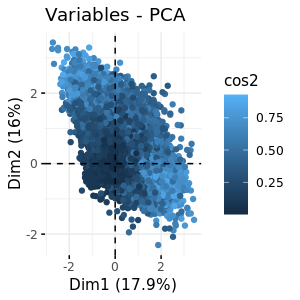

In [34]:
# display variables (genes) colored by quality
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
fviz_pca_var(X = log2_pca, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.4 **Scaled & centered** PCA on log2-transformed & filtered TPM counts

In [35]:
# scaling and centering data, here it has to happen before the log2 transformation!!
cnt_log2_scaled <- t(bcp_filtered)
cnt_log2_scaled <- as.data.frame(cnt_log2_scaled, stringsAsFactors = FALSE)

# scaling and centering
#cnt_log2_scaled <- cnt_log2_scaled+1

cnt_log2_scaled <- scale(cnt_log2_scaled, center = TRUE, scale = TRUE)
head(cnt_log2_scaled)

# log2
cnt_log2_scaled <- cnt_log2_scaled+2
cnt_log2_scaled <- log2(cnt_log2_scaled)
head(cnt_log2_scaled)
# adding rownames=ID as a column
cnt_log2_scaled <- as.data.frame(cnt_log2_scaled, stringsAsFactors = TRUE)
cnt_log2_scaled <- cbind(ID = rownames(cnt_log2_scaled), cnt_log2_scaled)
rownames(cnt_log2_scaled) <- cnt_log2_scaled$ID
dim(cnt_log2_scaled)
head(cnt_log2_scaled)

,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,TraesCHI1A01G001000,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
SRR10737427,-0.5645312,-0.30021,-0.4655046,-0.7031337,-0.41510656,2.0253862,1.81323086,2.754951934,0.335223624,6.3485722,⋯,-0.138845,-0.6597095,4.2559016,-0.3231747,-0.8151856,-0.6770217,-0.3173443,-0.147865,5.0143314,-0.1405751
SRR10737428,-0.5645312,-0.30021,-0.4655046,-0.7031337,-0.09046365,-0.2899675,-0.20717119,-0.361259212,-0.162256059,-0.2638432,⋯,-0.138845,-0.6601170,2.7280886,-0.3231747,-0.8151856,-0.6770217,-0.3173443,-0.147865,4.8560034,-0.1405751
SRR10737429,-0.5645312,-0.30021,-0.4655046,-0.7031337,-0.13684121,1.6141510,0.57436412,0.958687553,-0.045957832,2.1636686,⋯,-0.138845,-0.6600006,2.0662585,-0.3231747,-0.8151856,-0.6770217,-0.3173443,-0.147865,2.2222391,-0.1405751
SRR10737430,-0.5645312,-0.30021,-0.4655046,-0.6474424,-0.04408609,0.2996697,0.38651990,0.119397940,-0.068280768,1.7326990,⋯,-0.138845,-0.5951515,-0.2682098,-0.3231747,-0.8151856,-0.6770217,-0.3173443,-0.147865,-0.3035395,-0.1405751
SRR10737431,-0.5645312,-0.30021,-0.4655046,-0.6493387,-0.36872900,-0.2125091,-0.20700373,0.001256864,-0.170700982,-0.2632714,⋯,-0.138845,-0.6163992,-0.2632794,-0.3231747,-0.8151856,-0.6770217,-0.3173443,-0.147865,-0.3014811,-0.1405751
SRR10737432,-0.5645312,-0.30021,-0.4655046,-0.6810667,-0.32235145,0.6597970,0.03392691,1.075124223,-0.005953646,1.9335234,⋯,-0.138845,-0.6375886,-0.2682098,-0.3231747,-0.8151856,-0.6770217,-0.3173443,-0.147865,-0.3045687,-0.1405751


,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,TraesCHI1A01G001000,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
SRR10737427,0.521522,0.7653565,0.6177643,0.3750297,0.6643858,2.0091272,1.9310139,2.2494308,1.2235607,3.0615295,⋯,0.8961982,0.4225457,2.6452178,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.8103056,0.8948565
SRR10737428,0.521522,0.7653565,0.6177643,0.3750297,0.9332224,0.7740238,0.8422377,0.7125877,0.8779358,0.7958972,⋯,0.8961982,0.4221070,2.2412571,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.7773678,0.8948565
SRR10737429,0.521522,0.7653565,0.6177643,0.3750297,0.8977506,1.8536568,1.3642161,1.5649574,0.9664616,2.0578552,⋯,0.8961982,0.4222324,2.0237019,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.0780083,0.8948565
SRR10737430,0.521522,0.7653565,0.6177643,0.4356901,0.9678429,1.2014266,1.2549084,1.0836545,0.9498854,1.9002192,⋯,0.8961982,0.4904146,0.7922642,0.7457324,0.2446611,0.4037894,0.75074,0.8891893,0.7625279,0.8948565
SRR10737431,0.521522,0.7653565,0.6177643,0.4336659,0.7059965,0.8379359,0.8423725,1.0009064,0.8712909,0.7963723,⋯,0.8961982,0.4684278,0.7963657,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7642773,0.8948565
SRR10737432,0.521522,0.7653565,0.6177643,0.3993716,0.7464405,1.4113161,1.0242678,1.6206447,0.9956989,1.9758222,⋯,0.8961982,0.4461624,0.7922642,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7616524,0.8948565


[1]    215 120298

,ID,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,0.521522,0.7653565,0.6177643,0.3750297,0.6643858,2.0091272,1.9310139,2.2494308,1.2235607,⋯,0.8961982,0.4225457,2.6452178,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.8103056,0.8948565
SRR10737428,SRR10737428,0.521522,0.7653565,0.6177643,0.3750297,0.9332224,0.7740238,0.8422377,0.7125877,0.8779358,⋯,0.8961982,0.4221070,2.2412571,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.7773678,0.8948565
SRR10737429,SRR10737429,0.521522,0.7653565,0.6177643,0.3750297,0.8977506,1.8536568,1.3642161,1.5649574,0.9664616,⋯,0.8961982,0.4222324,2.0237019,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.0780083,0.8948565
SRR10737430,SRR10737430,0.521522,0.7653565,0.6177643,0.4356901,0.9678429,1.2014266,1.2549084,1.0836545,0.9498854,⋯,0.8961982,0.4904146,0.7922642,0.7457324,0.2446611,0.4037894,0.75074,0.8891893,0.7625279,0.8948565
SRR10737431,SRR10737431,0.521522,0.7653565,0.6177643,0.4336659,0.7059965,0.8379359,0.8423725,1.0009064,0.8712909,⋯,0.8961982,0.4684278,0.7963657,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7642773,0.8948565
SRR10737432,SRR10737432,0.521522,0.7653565,0.6177643,0.3993716,0.7464405,1.4113161,1.0242678,1.6206447,0.9956989,⋯,0.8961982,0.4461624,0.7922642,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7616524,0.8948565


In [36]:
# include metadata table
cnt_meta_log2_scaled <- inner_join(wheat_tech_meta, cnt_log2_scaled, by = "ID")
# add rownames again
rownames(cnt_meta_log2_scaled) <- cnt_meta_log2_scaled$ID
dim(cnt_meta_log2_scaled)
head(cnt_meta_log2_scaled)

[1]    215 120311

,ID,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.8961982,0.4225457,2.6452178,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.8103056,0.8948565
SRR10737428,SRR10737428,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.8961982,0.4221070,2.2412571,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.7773678,0.8948565
SRR10737429,SRR10737429,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.8961982,0.4222324,2.0237019,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.0780083,0.8948565
SRR10737430,SRR10737430,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.8961982,0.4904146,0.7922642,0.7457324,0.2446611,0.4037894,0.75074,0.8891893,0.7625279,0.8948565
SRR10737431,SRR10737431,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.8961982,0.4684278,0.7963657,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7642773,0.8948565
SRR10737432,SRR10737432,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,⋯,0.8961982,0.4461624,0.7922642,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7616524,0.8948565


In [37]:
# convert variables which are not factor into factor that they could be part of pca
cnt_meta_log2_scaled$rna_input<-factor(cnt_meta_log2_scaled$rna_input)
cnt_meta_log2_scaled$batch<-factor(cnt_meta_log2_scaled$batch)
class(cnt_meta_log2_scaled$rna_input)
class(cnt_meta_log2_scaled$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
cnt_meta_log2_scaled <- droplevels(cnt_meta_log2_scaled)
# delete ID column to not have it as extra supplementary variable
cnt_meta_log2_scaled <- select(cnt_meta_log2_scaled, -ID)
head(cnt_meta_log2_scaled)

[1] "factor"

[1] "factor"

,dataset,batch,rna_extraction,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.8961982,0.4225457,2.6452178,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.8103056,0.8948565
SRR10737428,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.8961982,0.4221070,2.2412571,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.7773678,0.8948565
SRR10737429,cytoplasmic_male_sterility,1,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.8961982,0.4222324,2.0237019,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,2.0780083,0.8948565
SRR10737430,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.8961982,0.4904146,0.7922642,0.7457324,0.2446611,0.4037894,0.75074,0.8891893,0.7625279,0.8948565
SRR10737431,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.8961982,0.4684278,0.7963657,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7642773,0.8948565
SRR10737432,cytoplasmic_male_sterility,2,trizol,oligo_dT_bead,unknown,AMPure_XP_bead,field,natural,natural,China_Northwest_University,⋯,0.8961982,0.4461624,0.7922642,0.7457324,0.2446610,0.4037894,0.75074,0.8891893,0.7616524,0.8948565


In [38]:
log2_pca_scaled <- PCA(X = cnt_meta_log2_scaled, scale.unit = FALSE, ncp = 4, quali.sup = c(1:13), graph = F)
#summary(log2_pca_scaled)

,eigenvalue,percentage of variance,cumulative percentage of variance
comp 1,8263.8499,29.880755,29.88076
comp 2,2614.7718,9.454595,39.33535
comp 3,1958.7100,7.082381,46.41773
comp 4,1309.5734,4.735207,51.15294
comp 5,1266.4889,4.579421,55.73236
comp 6,958.7602,3.466723,59.19908


Warning message in brewer.pal(18, "Paired"):
“n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
”Too few points to calculate an ellipse


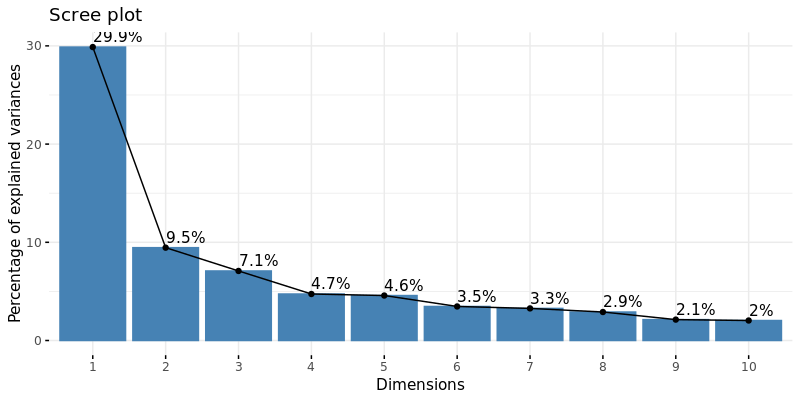

Too few points to calculate an ellipse


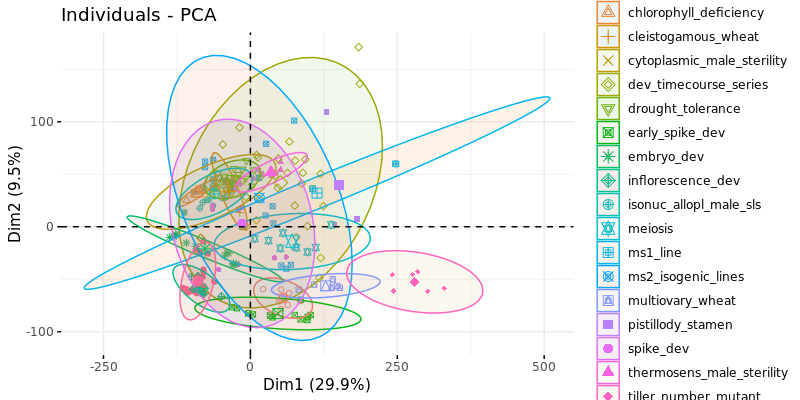

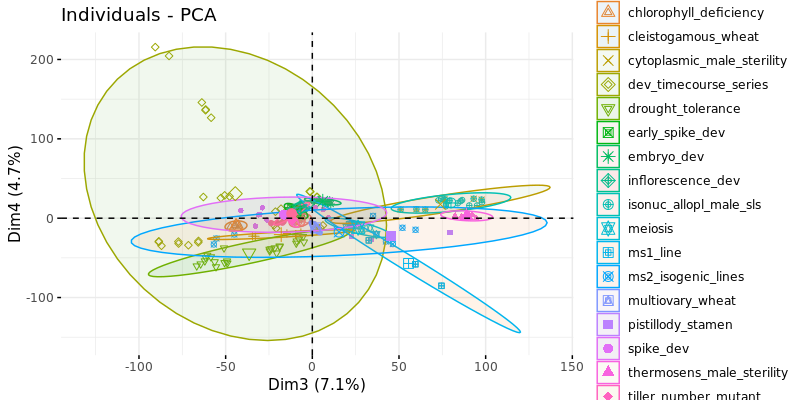

In [39]:
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(log2_pca_scaled$eig)
# display scree plot
fviz_eig(log2_pca_scaled, addlabels = TRUE)
# display individuals (samples) colored by technical variable
colourCount = length(unique(cnt_log_meta$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = log2_pca_scaled, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_meta_log2_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = log2_pca_scaled, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(3, 4), habillage = cnt_meta_log2_scaled$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

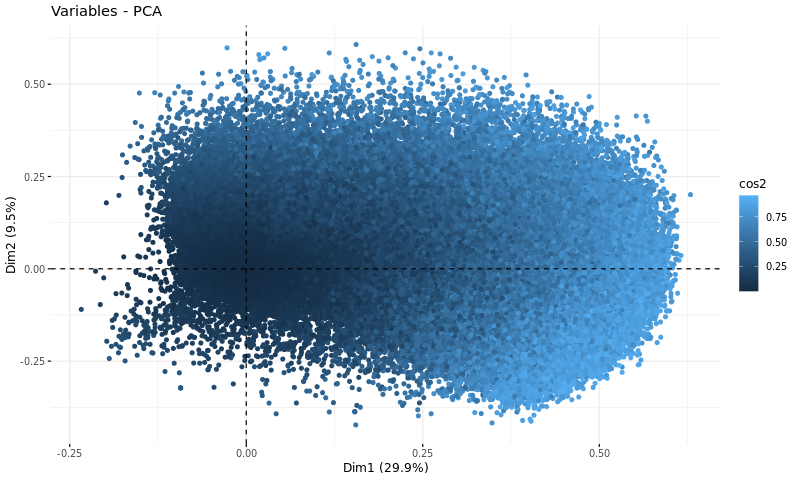

In [40]:
# display variables (genes) colored by quality
options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 80)
fviz_pca_var(X = log2_pca_scaled, col.var = "cos2", axes = 1:2, label = "none", geom = "point")

# 1.5 Summarizing all PCA plots

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Too few points to calculate an ellipse
Too few points to calculate an ellipse
Too few points to calculate an ellipse
Too few points to calculate an ellipse
Too few points to calculate an ellipse


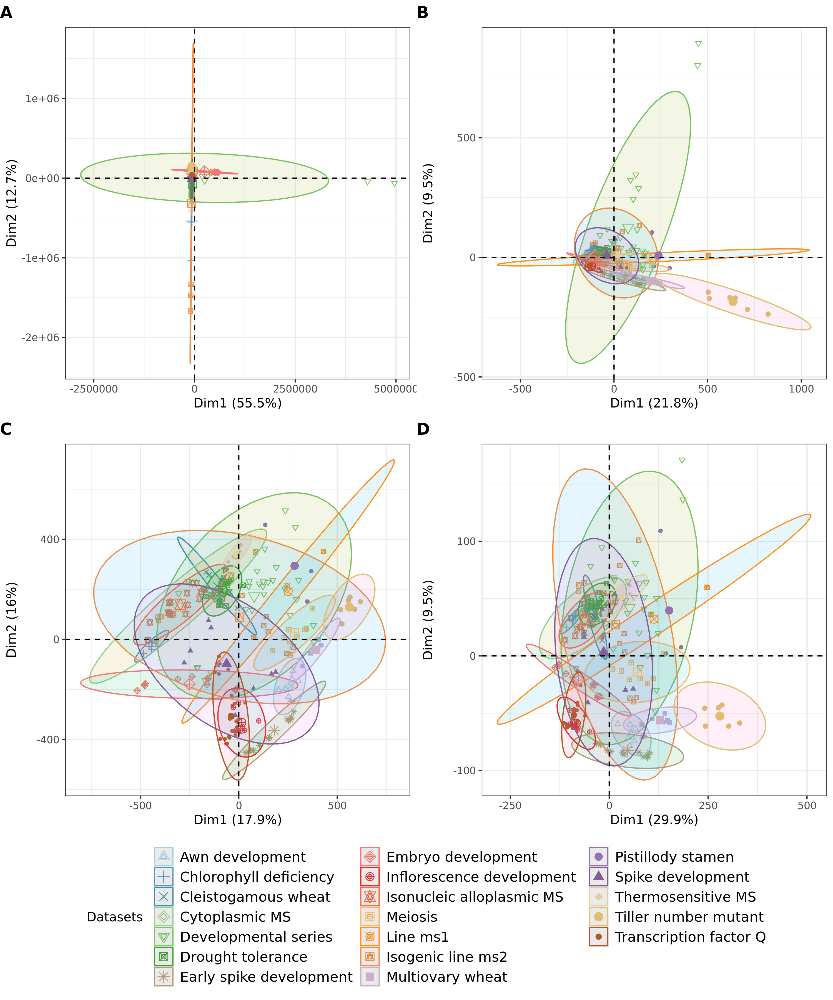

In [171]:
# figure to save
options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)

#Raw unscaled PCA
p1 <- fviz_pca_ind(X = raw_pca, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_color_manual(values = mycolors, name = "Datasets   ",
                           labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
        scale_shape_manual(name = "Datasets   ", 
                           labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()
#Raw scaled & centered PCA
p2 <- fviz_pca_ind(X = raw_pca_scaled, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_color_manual(values = mycolors, name = "Datasets   ") +
        scale_shape_manual(name = "Datasets   ",  
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20))+
        theme_bw()
#Log2 & filtered unscaled PCA
p3 <- fviz_pca_ind(X = log2_pca, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_color_manual(values = mycolors, name = "Datasets   ") +
        scale_shape_manual(name = "Datasets   ", 
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
        theme_bw()
#Log2 & filtered, scaled & centered PCA
p4 <- fviz_pca_ind(X = log2_pca_scaled, label = "none", title = "", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = cnt_log_meta$dataset) +
        scale_color_manual(values = mycolors, name = "Datasets   ") +
        scale_shape_manual(name = "Datasets   ", 
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
        theme_bw()

prow1 <- plot_grid(p1 + theme(legend.position="none"),
                  p2 + theme(legend.position="none"),
                  p3 + theme(legend.position="none"),
                  p4 + theme(legend.position="none"),
                  labels=c("A", "B", "C", "D"), align = 'vh', hjust = 0, nrow = 2)

legend1 <- get_legend(p1 + guides(color = guide_legend(nrow = 7)) +
                      theme(legend.position = "bottom", legend.text=element_text(size=12)))
types4 <- plot_grid(prow1, legend1, ncol = 1, rel_heights = c(1, .2))
types4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("pca_4types_wheat.pdf", plot = types4, width = 10, height = 12)

# 2. UMAP
## 2.1 UMAP on raw TPM counts

In [42]:
# switching cnt-table rows to columns
umap_cnt<- t(h)
umap_cnt <- as.data.frame(umap_cnt, stringsAsFactors = TRUE)
# adding rownames=ID as a column
umap_cnt <- cbind(ID = rownames(umap_cnt), umap_cnt)
rownames(umap_cnt) <- umap_cnt$ID
dim(umap_cnt)
head(umap_cnt)

[1]    215 123076

,ID,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,⋯,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200,TraesCHIUn01G316300
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,0,0,0,0.000000,1,193.395199,79.129559,26.435908,2.193419e+03,⋯,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0,0
SRR10737428,SRR10737428,0,0,0,0.000000,8,2.465932,3.067772,0.000000,3.662236e+01,⋯,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0,0
SRR10737429,SRR10737429,0,0,0,0.000000,7,159.483818,32.490120,11.197569,5.408272e+02,⋯,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0,0
SRR10737430,SRR10737430,0,0,0,4.893036,9,51.088736,25.418376,4.077583,4.440473e+02,⋯,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0,0
SRR10737431,SRR10737431,0,0,0,4.726423,2,8.853329,3.074076,3.075350,9.848208e-03,⋯,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0,0
SRR10737432,SRR10737432,0,0,0,1.938802,3,80.785644,12.144357,12.185342,7.142632e+02,⋯,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0,0


In [45]:
# include metadata table
umap_meta <- inner_join(wheat_meta, umap_cnt, by = "ID")
# add rownames again
rownames(umap_meta) <- umap_meta$ID
dim(umap_meta)
head(umap_meta)

[1]    215 123097

,ID,dataset,batch,cultivar,gm,zadoc_scale,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200,TraesCHIUn01G316300
,<fct>,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,cytoplasmic_male_sterility,1,303-B,wt,56,Heading,Reproductive,anther,inflorescence,⋯,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0,0
SRR10737428,SRR10737428,cytoplasmic_male_sterility,1,303-B,wt,56,Heading,Reproductive,anther,inflorescence,⋯,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0,0
SRR10737429,SRR10737429,cytoplasmic_male_sterility,1,303-B,wt,56,Heading,Reproductive,anther,inflorescence,⋯,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0,0
SRR10737430,SRR10737430,cytoplasmic_male_sterility,2,C303A,mut,56,Heading,Reproductive,anther,inflorescence,⋯,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0,0
SRR10737431,SRR10737431,cytoplasmic_male_sterility,2,C303A,mut,56,Heading,Reproductive,anther,inflorescence,⋯,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0,0
SRR10737432,SRR10737432,cytoplasmic_male_sterility,2,C303A,mut,56,Heading,Reproductive,anther,inflorescence,⋯,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0,0


In [46]:
umap_data = umap_meta[, grep("Traes", colnames(umap_meta))]
umap_labels = umap_meta[1:22]
#create umap table
u <- umap(umap_data)
u
#inspect table
head(u$layout, 3)

umap embedding of 215 items in 2 dimensions
object components: layout, data, knn, config


SRR10737427,-1.612778,4.822872
SRR10737428,-3.206381,5.289129
SRR10737429,-1.723553,4.932537


In [47]:
udf <- as.data.frame(u$layout)
glimpse(udf)

Rows: 215
Columns: 2
$ V1 <dbl> -1.612778, -3.206381, -1.723553, -2.065553, -2.556062, -2.120904, …
$ V2 <dbl> 4.822872, 5.289129, 4.932537, 5.328558, 5.704857, 5.418181, 4.7134…


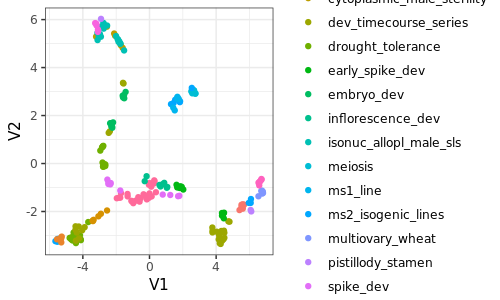

In [48]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)
ggplot(udf, aes(x = V1, y = V2, color = umap_labels$dataset)) +
  geom_point()

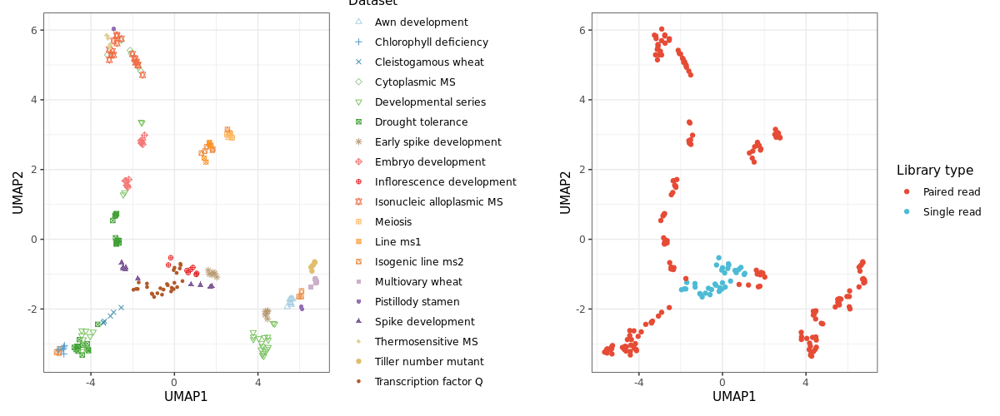

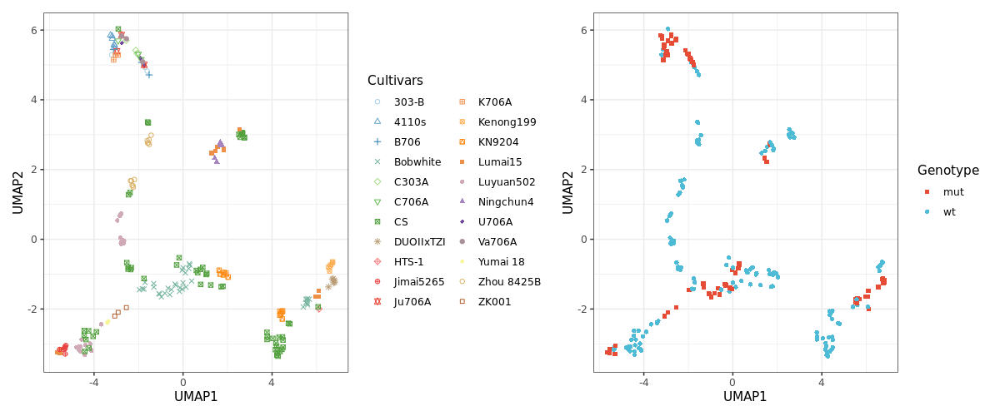

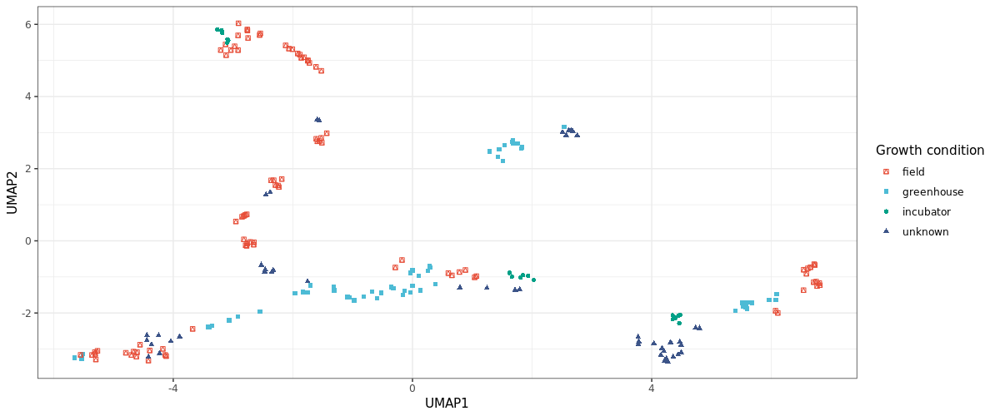

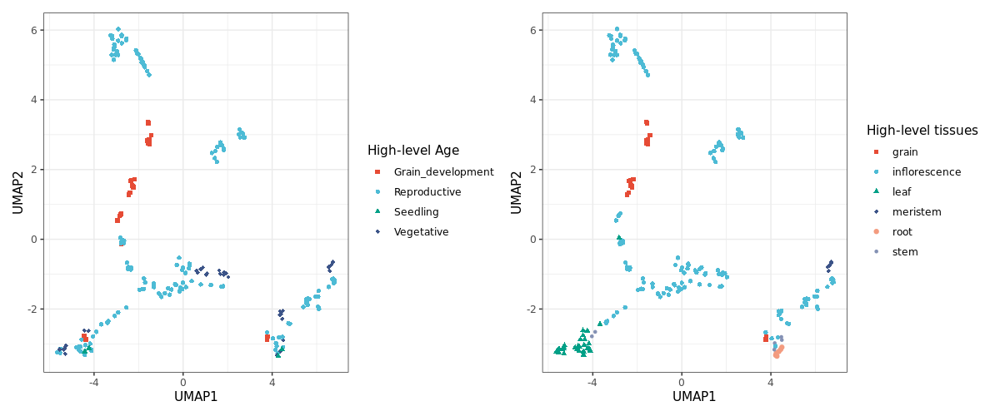

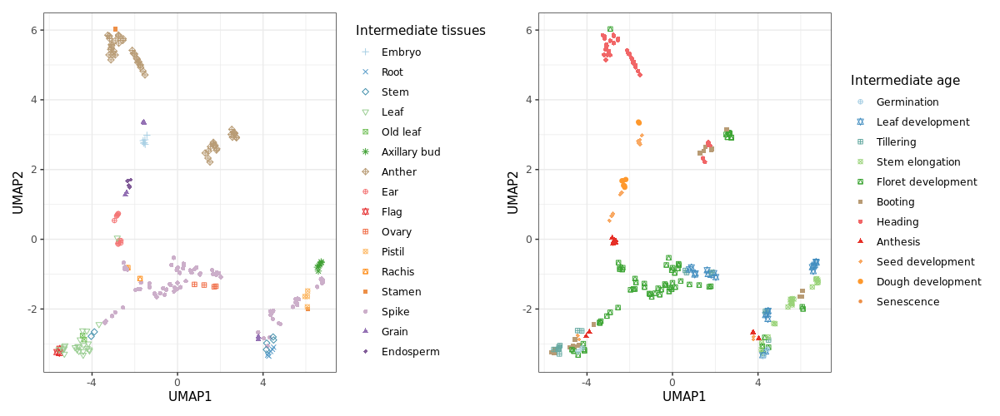

In [148]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 100)
rb1 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$dataset, shape = umap_labels_log$dataset)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_color_manual(values = mycolors, name = "Dataset",
                               labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
                scale_shape_manual(name = "Dataset", 
                                   labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
                theme_bw()
rb2 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$library, shaper = umap_labels_log$library)) +
                  geom_point() +
                xlab("UMAP1") + 
                ylab("UMAP2") +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
                scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read")) +
                theme_bw()
rb3 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$high_level_age, shape = umap_labels_log$high_level_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level Age") +
                scale_shape_manual(name = "High-level Age", values = c(15, 16, 17, 18, 19)) +
                theme_bw()
rb4 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues") +
                scale_shape_manual(name = "High-level tissues", 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
rb5 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors,  name = "Intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm")) +
                scale_shape_manual(name = "Intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 

rb6 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_age, shape = umap_labels_log$intermediate_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal, name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence")) +
                scale_shape_manual(name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence"),
                                   values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

rb7 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$cultivar, shape = umap_labels_log$cultivar)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors2, name = "Cultivars") +
                scale_shape_manual(name = "Cultivars", 
                      values = c(1,2,3,4,5,6,7,8,9,10,11,12,13,14, 15, 16, 17, 18, 19, 20,21,22)) +
                theme_bw()

#gm
rb8 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$gm, shape = umap_labels_log$gm)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
                scale_shape_manual(name = "Genotype", 
                      values = c(15, 16)) +
                theme_bw()

#growth condition
rb9 <- ggplot(udf, aes(x = V1, y = V2, color = umap_labels_log$growth_condition, shape = umap_labels_log$growth_condition)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
                scale_shape_manual(name = "Growth condition", 
                      values = c(14, 15, 16, 17)) +
                theme_bw()
rb1 + rb2 
rb7 + rb8
rb9
rb3 + rb4 
rb5 + rb6

## 2.2 UMAP on raw & filtered TPMs

In [157]:
# switching cnt-table rows to columns
umap_cnt_f<- t(bcp_filtered)
umap_cnt_f <- as.data.frame(umap_cnt_f, stringsAsFactors = TRUE)
# adding rownames=ID as a column
umap_cnt_f <- cbind(ID = rownames(umap_cnt_f), umap_cnt_f)
rownames(umap_cnt_f) <- umap_cnt_f$ID
dim(umap_cnt_f)
head(umap_cnt_f)

[1]    215 120298

,ID,TraesCHI1A01G000100,TraesCHI1A01G000200,TraesCHI1A01G000300,TraesCHI1A01G000400,TraesCHI1A01G000500,TraesCHI1A01G000600,TraesCHI1A01G000700,TraesCHI1A01G000800,TraesCHI1A01G000900,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,0,0,0,0.000000,1,193.395199,79.129559,26.435908,2.193419e+03,⋯,0,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0
SRR10737428,SRR10737428,0,0,0,0.000000,8,2.465932,3.067772,0.000000,3.662236e+01,⋯,0,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0
SRR10737429,SRR10737429,0,0,0,0.000000,7,159.483818,32.490120,11.197569,5.408272e+02,⋯,0,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0
SRR10737430,SRR10737430,0,0,0,4.893036,9,51.088736,25.418376,4.077583,4.440473e+02,⋯,0,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0
SRR10737431,SRR10737431,0,0,0,4.726423,2,8.853329,3.074076,3.075350,9.848208e-03,⋯,0,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0
SRR10737432,SRR10737432,0,0,0,1.938802,3,80.785644,12.144357,12.185342,7.142632e+02,⋯,0,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0


In [158]:
# include metadata table
umap_f_meta <- inner_join(wheat_meta, umap_cnt_f, by = "ID")
# add rownames again
rownames(umap_f_meta) <- umap_f_meta$ID
dim(umap_f_meta)
head(umap_f_meta)

[1]    215 120319

,ID,dataset,batch,cultivar,gm,zadoc_scale,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<int>,<fct>,<fct>,<int>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,SRR10737427,cytoplasmic_male_sterility,1,303-B,wt,56,Heading,Reproductive,anther,inflorescence,⋯,0,3.666667,917.5968,0,0.000000e+00,0,0,0,5167.999,0
SRR10737428,SRR10737428,cytoplasmic_male_sterility,1,303-B,wt,56,Heading,Reproductive,anther,inflorescence,⋯,0,1.333333,607.7202,0,3.464740e-08,0,0,0,5014.163,0
SRR10737429,SRR10737429,cytoplasmic_male_sterility,1,303-B,wt,56,Heading,Reproductive,anther,inflorescence,⋯,0,2.000000,473.4854,0,0.000000e+00,0,0,0,2455.121,0
SRR10737430,SRR10737430,cytoplasmic_male_sterility,2,C303A,mut,56,Heading,Reproductive,anther,inflorescence,⋯,0,373.333333,0.0000,0,4.635354e-07,0,0,0,1.000,0
SRR10737431,SRR10737431,cytoplasmic_male_sterility,2,C303A,mut,56,Heading,Reproductive,anther,inflorescence,⋯,0,251.666667,1.0000,0,0.000000e+00,0,0,0,3.000,0
SRR10737432,SRR10737432,cytoplasmic_male_sterility,2,C303A,mut,56,Heading,Reproductive,anther,inflorescence,⋯,0,130.333333,0.0000,0,0.000000e+00,0,0,0,0.000,0


In [160]:
umap_f_data = umap_f_meta[, grep("Traes", colnames(umap_f_meta))]
umap_f_labels = umap_f_meta[1:22]
#create umap table
uf <- umap(umap_f_data)
uf
#inspect table
head(uf$layout, 3)

umap embedding of 215 items in 2 dimensions
object components: layout, data, knn, config


SRR10737427,-4.369458,6.151986
SRR10737428,-4.998671,7.713855
SRR10737429,-4.338984,6.188237


In [161]:
urf <- as.data.frame(uf$layout)
glimpse(urf)

Rows: 215
Columns: 2
$ V1 <dbl> -4.369458, -4.998671, -4.338984, -4.569844, -5.055378, -4.576183, …
$ V2 <dbl> 6.151986, 7.713855, 6.188237, 6.481906, 7.082483, 6.441422, 6.1652…


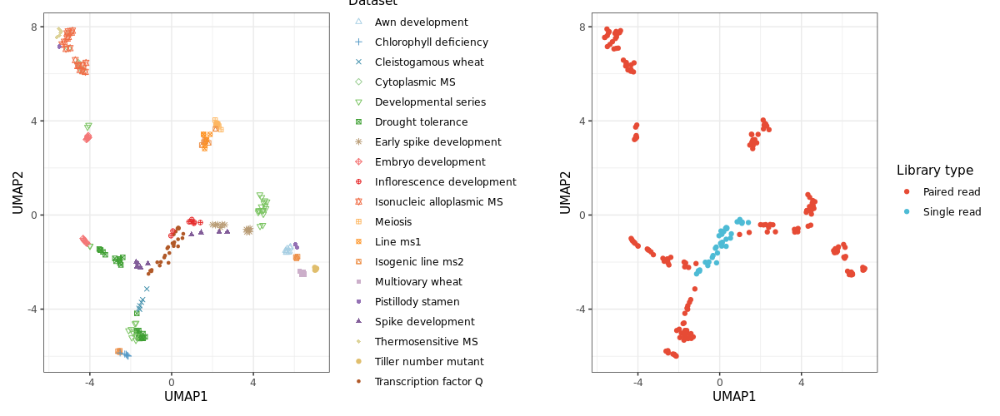

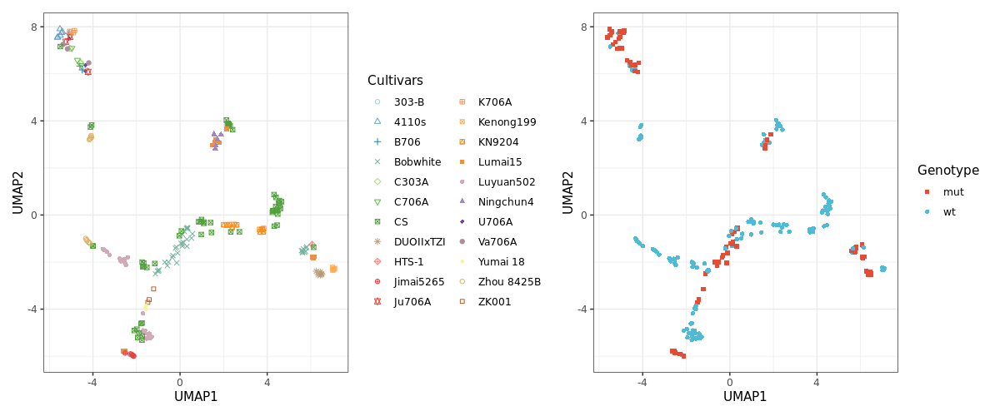

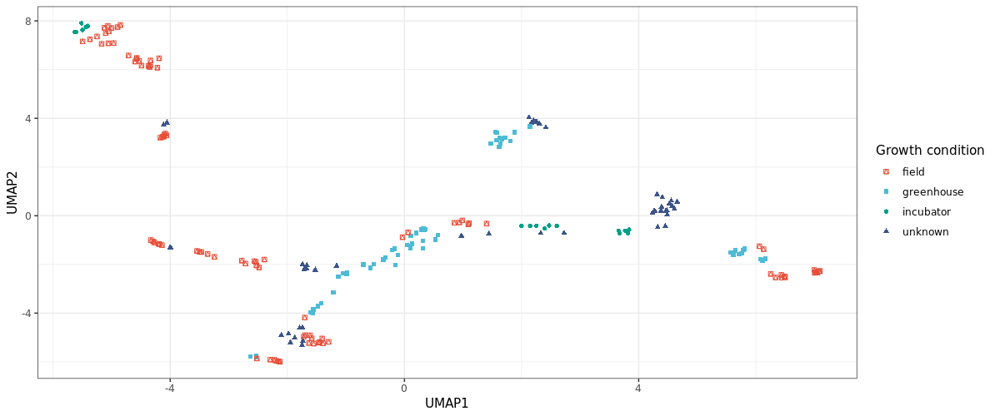

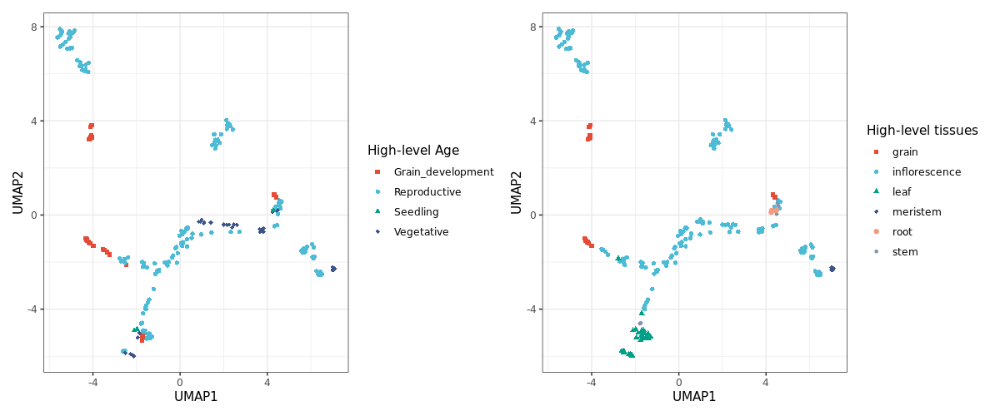

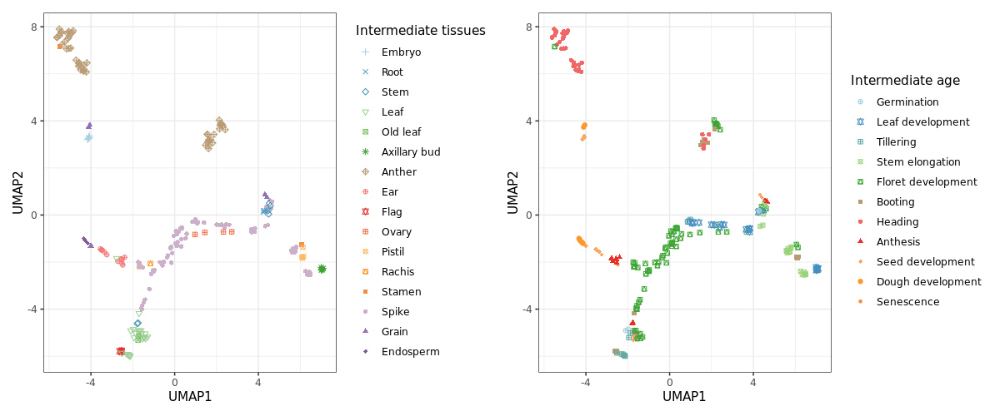

In [184]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 100)
rfb1 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$dataset, shape = umap_labels_log$dataset)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_color_manual(values = mycolors, name = "Dataset",
                               labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
                scale_shape_manual(name = "Dataset", 
                                   labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
                theme_bw()
rfb2 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$library, shaper = umap_labels_log$library)) +
                  geom_point() +
                xlab("UMAP1") + 
                ylab("UMAP2") +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
                scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read")) +
                theme_bw()
rfb3 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$high_level_age, shape = umap_labels_log$high_level_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level Age") +
                scale_shape_manual(name = "High-level Age", values = c(15, 16, 17, 18, 19)) +
                theme_bw()
rfb4 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues") +
                scale_shape_manual(name = "High-level tissues", 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
rfb5 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors,  name = "Intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm")) +
                scale_shape_manual(name = "Intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 

rfb6 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_age, shape = umap_labels_log$intermediate_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal, name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence")) +
                scale_shape_manual(name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence"),
                                   values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

rfb7 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$cultivar, shape = umap_labels_log$cultivar)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors2, name = "Cultivars") +
                scale_shape_manual(name = "Cultivars", 
                      values = c(1,2,3,4,5,6,7,8,9,10,11,12,13,14, 15, 16, 17, 18, 19, 20,21,22)) +
                theme_bw()

#gm
rfb8 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$gm, shape = umap_labels_log$gm)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
                scale_shape_manual(name = "Genotype", 
                      values = c(15, 16)) +
                theme_bw()

#growth condition
rfb9 <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$growth_condition, shape = umap_labels_log$growth_condition)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
                scale_shape_manual(name = "Growth condition", 
                      values = c(14, 15, 16, 17)) +
                theme_bw()
rfb1 + rfb2 
rfb7 + rfb8
rfb9
rfb3 + rfb4 
rfb5 + rfb6



In [183]:
# save objects for figure creation
setwd("/home/vanda.marosi/floral_development_thesis_vm/")
saveRDS(umap_f_meta, file = "cnt_filt_wheat.rds")

## 2.3 UMAP on log2 & filtered TPMs

In [49]:
dim(cnt_log_meta)
head(cnt_log_meta)

[1]    215 120307

,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,⋯,TraesCHIUn01G315300,TraesCHIUn01G315400,TraesCHIUn01G315500,TraesCHIUn01G315600,TraesCHIUn01G315700,TraesCHIUn01G315800,TraesCHIUn01G315900,TraesCHIUn01G316000,TraesCHIUn01G316100,TraesCHIUn01G316200
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRR10737427,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,⋯,0,2.222392,9.843288,0,0.000000e+00,0,0,0,12.33567,0
SRR10737428,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,⋯,0,1.222392,9.249635,0,4.998564e-08,0,0,0,12.29208,0
SRR10737429,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,⋯,0,1.584963,8.890220,0,0.000000e+00,0,0,0,11.26217,0
SRR10737430,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,⋯,0,8.548180,0.000000,0,6.687401e-07,0,0,0,1.00000,0
SRR10737431,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,⋯,0,7.981092,1.000000,0,0.000000e+00,0,0,0,2.00000,0
SRR10737432,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,⋯,0,7.037089,0.000000,0,0.000000e+00,0,0,0,0.00000,0


In [50]:
umap_data_log = cnt_log_meta[, grep("Traes", colnames(cnt_log_meta))]
umap_labels_log = cnt_log_meta[1:13]

In [51]:
u_log <- umap(umap_data_log)
u_log

umap embedding of 215 items in 2 dimensions
object components: layout, data, knn, config


In [53]:
u_log_df <- as.data.frame(u_log$layout)
glimpse(u_log_df)

Rows: 215
Columns: 2
$ V1 <dbl> -1.243960, -1.407938, -1.303938, -2.059543, -1.827265, -1.917560, …
$ V2 <dbl> 8.509202, 8.596920, 8.520434, 7.489219, 7.701058, 7.760960, 8.5835…


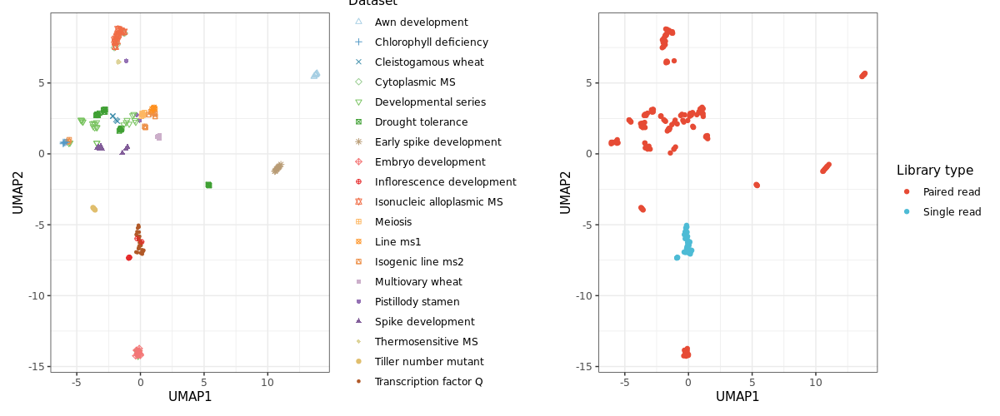

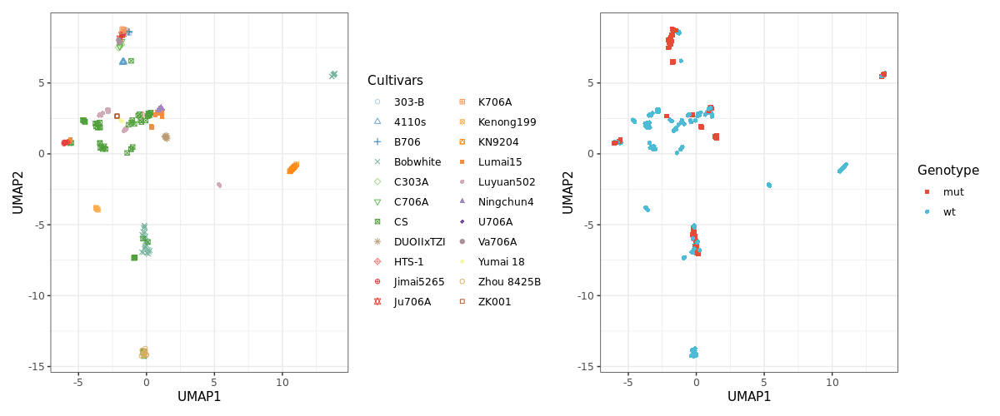

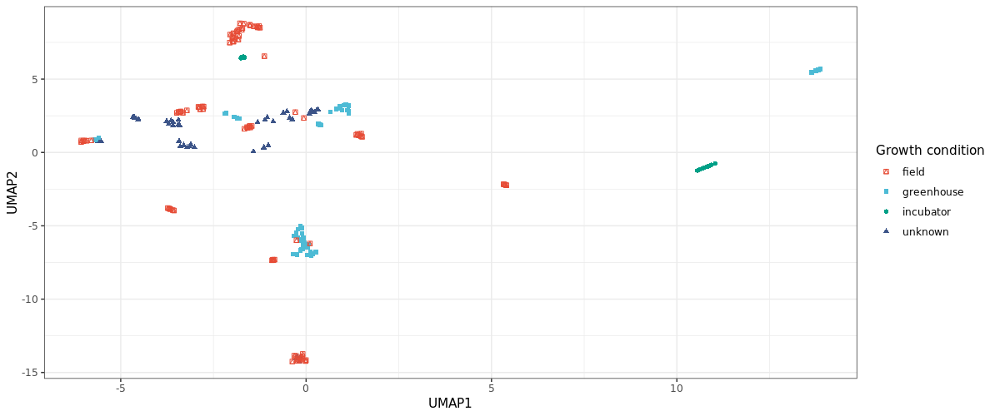

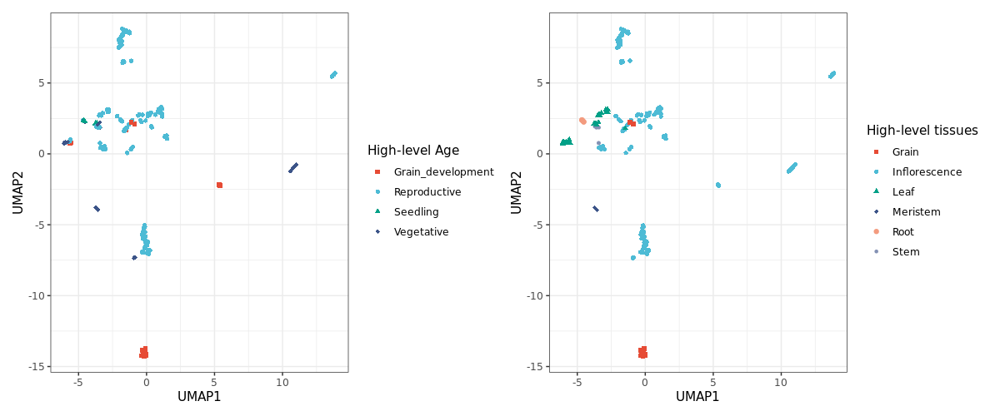

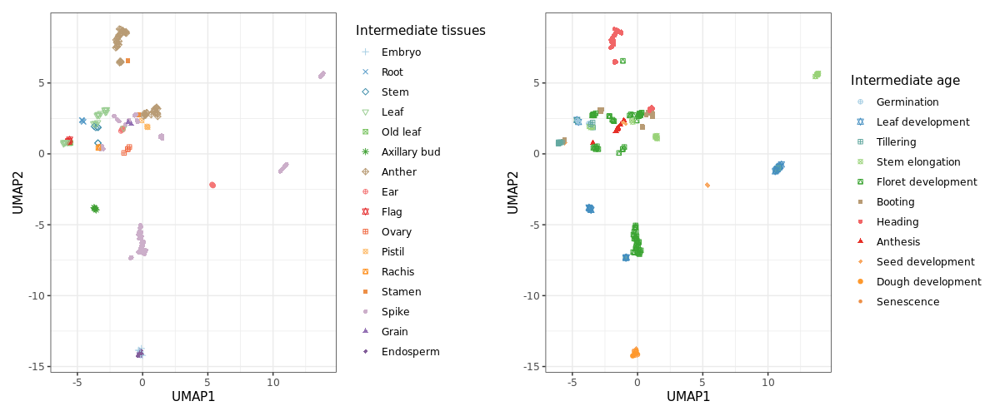

In [169]:
options(repr.plot.width = 12, repr.plot.height = 5, repr.plot.res = 100)
b1 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$dataset, shape = umap_labels_log$dataset)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_color_manual(values = mycolors, name = "Dataset",
                               labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
                scale_shape_manual(name = "Dataset", 
                                   labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                      values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +
                theme_bw()
b2 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$library, shaper = umap_labels_log$library)) +
                  geom_point() +
                xlab("UMAP1") + 
                ylab("UMAP2") +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
                scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read")) +
                theme_bw()
b3 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$high_level_age, shape = umap_labels_log$high_level_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level Age") +
                scale_shape_manual(name = "High-level Age", values = c(15, 16, 17, 18, 19)) +
                theme_bw()
b4 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues", 
                         labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Stem")) +
                scale_shape_manual(name = "High-level tissues", labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Stem"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
b5 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors,  name = "Intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm")) +
                scale_shape_manual(name = "Intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw() 


b6 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$intermediate_age, shape = umap_labels_log$intermediate_age)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = myPal, name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence")) +
                scale_shape_manual(name = "Intermediate age",
                                   limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence"),
                                   values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()

b7 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$cultivar, shape = umap_labels_log$cultivar)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors2, name = "Cultivars") +
                scale_shape_manual(name = "Cultivars", 
                      values = c(1,2,3,4,5,6,7,8,9,10,11,12,13,14, 15, 16, 17, 18, 19, 20,21,22)) +
                theme_bw()

#gm
b8 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$gm, shape = umap_labels_log$gm)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
                scale_shape_manual(name = "Genotype", 
                      values = c(15, 16)) +
                theme_bw()

#growth condition
b9 <- ggplot(u_log_df, aes(x = V1, y = V2, color = umap_labels_log$growth_condition, shape = umap_labels_log$growth_condition)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
                scale_shape_manual(name = "Growth condition", 
                      values = c(14, 15, 16, 17)) +
                theme_bw()
b1 + b2 
b7 + b8
b9
b3 + b4 
b5 + b6

# 2.4 UMAP comparism figures

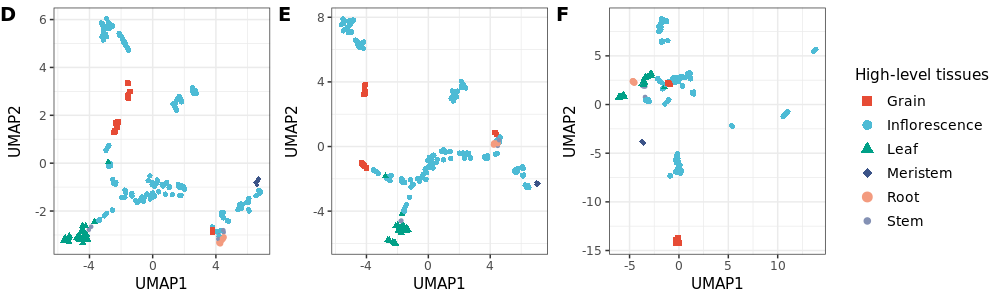

In [175]:
# figure to save
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(rb4 + theme(legend.position="none"),
                  rfb4 + theme(legend.position="none"),
                  b4 + theme(legend.position="none"),
                  labels=c("D", "E", "F"), align = 'vh', hjust = 0, nrow = 1)

legend1 <- get_legend(b4 + guides(color = guide_legend(ncol = 1), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10)))
types4 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.2))
types4
setwd("/home/vanda.marosi/floral_development_thesis_vm/")
saveRDS(types4, file = "umap_wheat_3types.rds")
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_3types_wheat_hightissue.pdf", plot = types4, width = 10, height = 3)

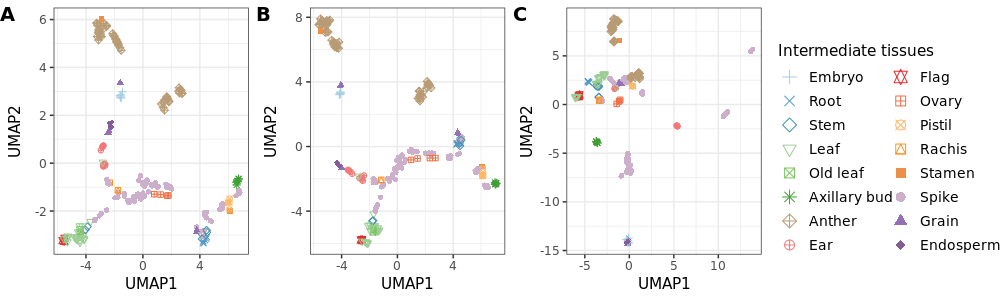

In [176]:
# figure to save
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(rb5 + theme(legend.position="none"),
                  rfb5 + theme(legend.position="none"),
                  b5 + theme(legend.position="none"),
                  labels=c("A", "B", "C"), align = 'vh', hjust = 0, nrow = 1)

legend1 <- get_legend(b5 + guides(color = guide_legend(ncol = 2), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10)))
types4 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.3))
types4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_3types_wheat_inttissue.pdf", plot = types4, width = 10, height = 3)

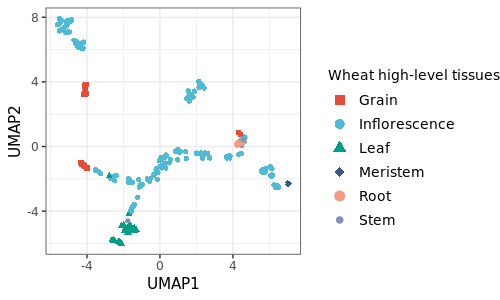

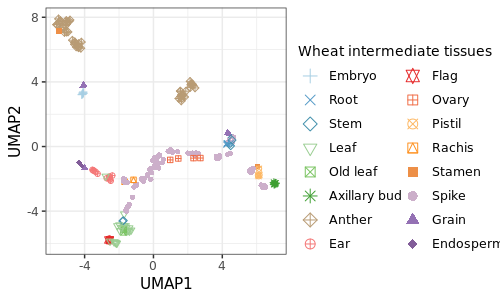

In [210]:
# figure to save
rfb4_a <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$high_level_tissue, shape = umap_labels_log$high_level_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Wheat high-level tissues",
                                labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Stem")) +
                scale_shape_manual(name = "Wheat high-level tissues", labels = c("Grain", "Inflorescence", "Leaf", "Meristem", "Root", "Stem"), 
                      values = c(15, 16, 17, 18, 19, 20)) +
                theme_bw()
rfb5_a <- ggplot(urf, aes(x = V1, y = V2, color = umap_labels_log$intermediate_tissue, shape = umap_labels_log$intermediate_tissue)) + 
                xlab("UMAP1") + 
                ylab("UMAP2") +
                geom_point() +
                scale_colour_manual(values = mycolors,  name = "Wheat intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm")) +
                scale_shape_manual(name = "Wheat intermediate tissues",
                                   limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm"),
                                   values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
                theme_bw()
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(rfb4_a + theme(legend.position="none"), align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(rfb4_a + guides(color = guide_legend(ncol = 1), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=10), legend.title=element_text(size=10)))
alone_b4 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.62))
alone_b4
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_rfb4_wheat.pdf", plot = alone_b4, width = 5, height = 3)

options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 100)

prow1 <- plot_grid(rfb5_a + theme(legend.position="none"), align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(rfb5_a + guides(color = guide_legend(ncol = 2), shape = guide_legend(override.aes = list(size = 3))) +
                      theme(legend.position = "right", legend.text=element_text(size=9), legend.title=element_text(size=10)))
alone_b5 <- plot_grid(prow1, legend1, ncol = 2, rel_widths = c(1, 0.7))
alone_b5
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
ggsave("umap_rfb5_wheat.pdf", plot = alone_b5, width = 5, height = 3)

# 3. ELC on filtered TPM counts

In [57]:
#Calculating ELC on filtered but NOT! log-transformed counts
dim(bcp_filtered)
#head(bcp_filtered)
elc_cnt <- as.data.frame(bcp_filtered)
#elc_cnt <- select(elc_cnt, -ID)
#elc_cnt <- t(elc_cnt)
head(elc_cnt)

[1] 120297    215

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TraesCHI1A01G000100,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.0000,⋯,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000200,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.0000,⋯,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000300,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,0.0000,⋯,6.0000,7.878112,14.0000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000400,0.0000,0.000000,0.0000,4.893036,4.726423,1.938802,0.0000,0.000000,0.0000,0.0000,⋯,140.5432,108.839845,177.3651,112.3966,1.993108,0.000000,0.000000,0.000000,2.004102,0.000000
TraesCHI1A01G000500,1.0000,8.000000,7.0000,9.000000,2.000000,3.000000,1.0000,8.000000,7.0000,9.0000,⋯,5.0000,11.000000,12.0000,5.0000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000
TraesCHI1A01G000600,193.3952,2.465932,159.4838,51.088736,8.853329,80.785644,193.3877,2.465675,159.5168,126.3058,⋯,387.2507,513.135328,458.2691,355.3096,0.000000,2.649372,1.307648,4.297154,4.083578,1.356089


In [58]:
non.expr.cutoff=0.5

get_elc=function(x,cut) {
    s=elc_cnt
    sx=x[x>cut]
    k=kmeans(log(sx+cut),4)
    kk=ordered(k$cluster,levels=order(k$centers))
    levels(kk)=paste("E",1:4,sep="")
    so=ordered(rep("E0",nrow(s)),levels=paste("E",0:4,sep=""))
    so[x>cut]=kk
    so
}
log_elc=apply(elc_cnt,2,get_elc,non.expr.cutoff)
colnames(log_elc)=colnames(elc_cnt)
rownames(log_elc)=rownames(elc_cnt)
head(log_elc)

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
TraesCHI1A01G000100,E0,E0,E0,E0,E0,E0,E0,E0,E0,E0,⋯,E0,E0,E0,E0,E0,E0,E0,E0,E0,E0
TraesCHI1A01G000200,E0,E0,E0,E0,E0,E0,E0,E0,E0,E0,⋯,E0,E0,E0,E0,E0,E0,E0,E0,E0,E0
TraesCHI1A01G000300,E0,E0,E0,E0,E0,E0,E0,E0,E0,E0,⋯,E1,E1,E1,E1,E0,E0,E0,E0,E0,E0
TraesCHI1A01G000400,E0,E0,E0,E1,E1,E1,E0,E0,E0,E0,⋯,E3,E2,E3,E2,E1,E0,E0,E0,E1,E0
TraesCHI1A01G000500,E1,E2,E2,E2,E1,E1,E1,E2,E2,E2,⋯,E1,E1,E1,E1,E1,E0,E1,E0,E0,E0
TraesCHI1A01G000600,E3,E1,E3,E3,E2,E3,E3,E1,E3,E3,⋯,E3,E3,E3,E3,E0,E1,E1,E1,E1,E1


In [60]:

elc_df <- as.data.frame(log_elc, stringsAsFactors = FALSE)
elc_df <- pivot_longer(elc_df, cols = c(1:215), names_to = "ID", values_to = "ELC")

elc_meta <- elc_df %>% select(ID, ELC) %>%
                dplyr::group_by(ID) %>%
                dplyr::summarise(total = n(), E0 = sum(ELC=="E0"), E1 = sum(ELC=="E1"), E2 = sum(ELC=="E2"), E3 = sum(ELC=="E3"), E4 = sum(ELC=="E4"))
elc_pca <- elc_meta %>% transmute(ID = ID, E0 = E0/total, E1 = E1/total, E2 = E2/total, E3 = E3/total, E4 = E4/total)
elc_pca_meta <- inner_join(elc_pca, wheat_meta, by = "ID")
elc_pca_meta <- as.data.frame(elc_pca_meta, stringsAsFactors = TRUE)
rownames(elc_pca_meta) <- elc_pca_meta$ID
elc_pca_meta <- select(elc_pca_meta, -ID)
head(elc_pca_meta)
dim(elc_pca_meta)

Warning message:
“Column `ID` joining character vector and factor, coercing into character vector”

,E0,E1,E2,E3,E4,dataset,batch,cultivar,gm,zadoc_scale,⋯,rna_enrichment,rna_input,pcr_purification,growth_condition,day_night,temp,growth_location,seq_location,instrument,library
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<int>,<fct>,<fct>,<int>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
CRR078059,0.4442006,0.1331455,0.1580172,0.1735954,0.09104134,transcriptfc_q_mutant,53,Bobwhite,wt,38,⋯,unknown,unknown,unknown,greenhouse,16_8,21,China,China,Illumina HiSeq 2000,single
CRR078060,0.4416985,0.1346750,0.1583581,0.1729636,0.09230488,transcriptfc_q_mutant,53,Bobwhite,wt,38,⋯,unknown,unknown,unknown,greenhouse,16_8,21,China,China,Illumina HiSeq 2000,single
CRR078061,0.4467942,0.1337689,0.1594470,0.1714507,0.08853920,transcriptfc_q_mutant,53,Bobwhite,wt,38,⋯,unknown,unknown,unknown,greenhouse,16_8,21,China,China,Illumina HiSeq 2000,single
CRR078062,0.4558717,0.1293050,0.1577928,0.1685911,0.08843945,transcriptfc_q_mutant,54,Bobwhite,wt,39,⋯,unknown,unknown,unknown,greenhouse,16_8,21,China,China,Illumina HiSeq 2000,single
CRR078063,0.4336101,0.1339767,0.1613257,0.1767043,0.09438307,transcriptfc_q_mutant,54,Bobwhite,wt,39,⋯,unknown,unknown,unknown,greenhouse,16_8,21,China,China,Illumina HiSeq 2000,single
CRR078064,0.3851468,0.1577928,0.1721739,0.1874777,0.09740891,transcriptfc_q_mutant,55,Bobwhite,wt,40,⋯,unknown,unknown,unknown,greenhouse,16_8,21,China,China,Illumina HiSeq 2000,single


[1] 215  26

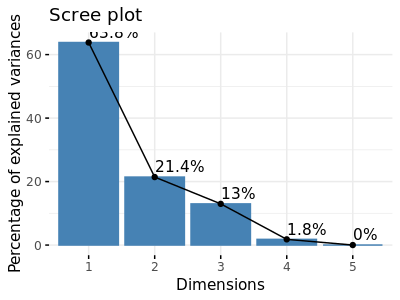

In [61]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 100)

elc_pca <- PCA(elc_pca_meta,quali.sup=c(6:26),graph=F)
fviz_screeplot(elc_pca, addlabels = TRUE)

In [150]:
# build comparism plot variables
c1 <- fviz_pca_ind(X = elc_pca, label = "none", legend.title = "Datasets", title = "", addEllipses = TRUE, axes = c(1, 2), habillage = elc_pca_meta$dataset) +
        scale_colour_manual(values = mycolors, name = "Datasets      ",
                           labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q")) +
        scale_shape_manual(name = "Datasets      ", 
                           labels = c("Awn development", "Chlorophyll deficiency", "Cleistogamous wheat", "Cytoplasmic MS",
                                     "Developmental series", "Drought tolerance", "Early spike development      ", "Embryo development",
                                     "Inflorescence development        ", "Isonucleic alloplasmic MS", "Meiosis", "Line ms1", 
                                     "Isogenic line ms2", "Multiovary wheat", "Pistillody stamen", "Spike development", 
                                     "Thermosensitive MS", "Tiller number mutant", "Transcription factor Q"),
                              values = c(2,3,4,5,6,7,8,9,10,11,12,13,14,15, 16, 17, 18, 19, 20)) +

        guides(fill = FALSE) +
        theme_bw()
                           
c2 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Library type", title = "", addEllipses = TRUE, habillage = elc_pca_meta$library) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Library type", labels = c("Paired read", "Single read")) +
        scale_shape_manual(name = "Library type", labels = c("Paired read", "Single read"), 
                      values = c(15, 16)) +
        guides(fill = FALSE)+
        theme_bw()

c3 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "High level age", title = "", addEllipses = FALSE, habillage = elc_pca_meta$high_level_age) +
        scale_colour_npg(palette = c("nrc"), alpha = 1,name = "High-level age") +
        scale_shape_manual(name = "High-level age",  
                      values = c(13, 14, 15, 16, 17, 18, 19)) +
        guides(fill = FALSE)+
        theme_bw()

c4 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "High level tissue", title = "", addEllipses = FALSE, habillage = elc_pca_meta$high_level_tissue) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "High-level tissues") +
        scale_shape_manual(name = "High-level tissues",  
                      values = c(15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE)+
        theme_bw()

cols <- colorRampPalette(brewer.pal(12, "Paired"))
myPal <- cols(length(unique(cnt_log_meta$intermediate_tissue)))

c5 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate tissue", title = "", addEllipses = FALSE, habillage = elc_pca_meta$intermediate_tissue) +
        scale_colour_manual(values = mycolors, name = "Intermediate tissues",
                           limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm")) + 
        scale_shape_manual(name = "Intermediate tissues",
                           limits = c("embryo", "root", "stem",
                                       "leaf", "senescence_leaf", "axillary bud",
                                      "anther", "ear", "flag", "ovary", "pistil", "rachis", "stamen", "spike",
                                      "grain", "endosperm"),
                            labels = c("Embryo", "Root", "Stem",
                                       "Leaf", "Old leaf", "Axillary bud",
                                      "Anther", "Ear", "Flag", "Ovary", "Pistil", "Rachis", "Stamen", "Spike",
                                      "Grain", "Endosperm"),
                      values = c(3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()                            

c6 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Intermediate age", title = "", addEllipses = FALSE, habillage = elc_pca_meta$intermediate_age) +
        scale_colour_manual(values = myPal, name = "Intermediate age",
                           limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence")) +
        scale_shape_manual(name = "Intermediate age",
                           limits = c("Germination", "Leaf_development", "Tillering", "Stem_elongation", "Floret_development", "Booting", "Heading",
                                       "Anthesis", "Seed_development", "Dough_development", "Senescence"),
                           labels = c("Germination", "Leaf development", "Tillering", "Stem elongation", "Floret development", "Booting", "Heading",
                                       "Anthesis", "Seed development", "Dough development", "Senescence"),
                      values = c(10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20)) +
        guides(fill = FALSE) +
        theme_bw()

c7 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Cultivars", title = "", addEllipses = FALSE, habillage = elc_pca_meta$cultivar) +
        scale_colour_manual(values = mycolors2, name = "Cultivars") +
        scale_shape_manual(name = "Cultivars", 
                      values = c(1,2,3,4,5,6,7,8,9,10,11,12,13,14, 15, 16, 17, 18, 19, 20,21,22)) +
        guides(fill = FALSE) +
        theme_bw()

#gm
c8 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Genotype", title = "", addEllipses = FALSE, habillage = elc_pca_meta$gm) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Genotype") +
        scale_shape_manual(name = "Genotype",
                      values = c(14, 15)) +
        guides(fill = FALSE) +
        theme_bw()

#growth condition
c9 <- fviz_pca_ind(X = elc_pca, geom="point", axes = c(1, 2), legend.title = "Growth condition", title = "", addEllipses = FALSE, habillage = elc_pca_meta$growth_condition) +
        scale_colour_npg(palette = c("nrc"), alpha = 1, name = "Growth condition") +
        scale_shape_manual(name = "Growth condition",
                      values = c(14, 15, 16, 17)) +
        guides(fill = FALSE) +
        theme_bw()

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.
Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.


# 3. Library size & log10 counts plots
### 3.1 Quality control: Create long-tables and see log10-transform counts
* here we check how comparable the TPMs are across experiments by making a boxplot of log10-transformed tpm normalized counts
* we have to add a value to avoid log(0), which is 1

In [63]:
# create table of gene_length
length_wheat <-data.frame(hord$length)
length_wheat <- cbind(geneid = rownames(length_wheat), length_wheat)
#to remove original rownames:
row.names(length_wheat) <- NULL
# for switching between wide and long table formats use "pivotlonger"
long_length_b <- pivot_longer(length_wheat, -geneid, names_to = "samples", values_to = "length")
dim(length_wheat)
head(length_wheat)
head(long_length_b)

[1] 123075    216

,geneid,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,TraesCHI1A01G000100,3722.80248,3722.80248,3722.80248,3722.80248,3722.80248,3722.80248,3722.80248,3722.80248,3722.80248,⋯,3722.80248,3722.80248,3722.80248,3722.80248,3722.8025,3722.8025,3722.8025,3722.8025,3722.8025,3722.8025
2,TraesCHI1A01G000200,1593.93397,1593.93397,1593.93397,1593.93397,1593.93397,1593.93397,1593.93397,1593.93397,1593.93397,⋯,1593.93397,1593.93397,1593.93397,1593.93397,1593.9340,1593.9340,1593.9340,1593.9340,1593.9340,1593.9340
3,TraesCHI1A01G000300,643.56181,643.56181,643.56181,643.56181,643.56181,643.56181,643.56181,643.56181,643.56181,⋯,547.51557,545.58640,536.55141,554.52053,643.5618,643.5618,643.5618,643.5618,643.5618,643.5618
4,TraesCHI1A01G000400,2941.80287,2941.80287,2941.80287,2743.53388,2724.01738,2616.14218,2941.80287,2941.80287,2941.80287,⋯,2910.13125,2920.38394,2854.31991,2923.59484,2801.2984,2941.8029,2941.8029,2941.8029,2826.1057,2941.8029
5,TraesCHI1A01G000500,2343.03504,2360.56346,2242.95170,2305.64742,2296.99423,2194.49733,2343.51382,2360.45737,2244.09839,⋯,2479.32298,2482.35578,2411.45393,2488.36257,2332.3951,2462.9398,2333.6107,2462.9398,2462.9398,2462.9398
6,TraesCHI1A01G000600,65.32633,62.54737,65.10625,60.42866,56.93287,66.01581,65.32583,62.73919,65.18579,⋯,81.87468,81.83392,82.43067,84.19832,103.0722,118.6819,121.2738,122.1550,121.9052,122.9274


geneid,samples,length
<fct>,<chr>,<dbl>
TraesCHI1A01G000100,SRR10737427,3722.802
TraesCHI1A01G000100,SRR10737428,3722.802
TraesCHI1A01G000100,SRR10737429,3722.802
TraesCHI1A01G000100,SRR10737430,3722.802
TraesCHI1A01G000100,SRR10737431,3722.802
TraesCHI1A01G000100,SRR10737432,3722.802


In [64]:
#convert filtered count matrix into dataframe
cnt_wheat_df <- data.frame(geneid = rownames(bcp_filtered), bcp_filtered, stringsAsFactors = TRUE)
#cnt <- cbind(GeneID = rownames(cnt), cnt)
#to remove original rownames:
row.names(cnt_wheat_df) <- NULL
dim(cnt_wheat_df)
head(cnt_wheat_df)
long_cnt_b <- pivot_longer(cnt_wheat_df, -geneid, names_to = "samples", values_to = "count")
head(long_cnt_b)

[1] 120297    216

,geneid,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,TraesCHI1A01G000100,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,⋯,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,TraesCHI1A01G000200,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,⋯,0.0000,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,TraesCHI1A01G000300,0.0000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0000,⋯,6.0000,7.878112,14.0000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,TraesCHI1A01G000400,0.0000,0.000000,0.0000,4.893036,4.726423,1.938802,0.0000,0.000000,0.0000,⋯,140.5432,108.839845,177.3651,112.3966,1.993108,0.000000,0.000000,0.000000,2.004102,0.000000
5,TraesCHI1A01G000500,1.0000,8.000000,7.0000,9.000000,2.000000,3.000000,1.0000,8.000000,7.0000,⋯,5.0000,11.000000,12.0000,5.0000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000
6,TraesCHI1A01G000600,193.3952,2.465932,159.4838,51.088736,8.853329,80.785644,193.3877,2.465675,159.5168,⋯,387.2507,513.135328,458.2691,355.3096,0.000000,2.649372,1.307648,4.297154,4.083578,1.356089


geneid,samples,count
<fct>,<chr>,<dbl>
TraesCHI1A01G000100,SRR10737427,0
TraesCHI1A01G000100,SRR10737428,0
TraesCHI1A01G000100,SRR10737429,0
TraesCHI1A01G000100,SRR10737430,0
TraesCHI1A01G000100,SRR10737431,0
TraesCHI1A01G000100,SRR10737432,0


In [65]:
logtransform <- semi_join(long_cnt_b, long_length_b, by = "geneid")
dim(logtransform)

Warning message:
“Column `geneid` joining factors with different levels, coercing to character vector”

[1] 25863855        3

In [66]:
logtransform <- logtransform %>% dplyr::mutate(minTPM = min(count[count>0]), log10TPM = log10(count+1))
head(logtransform)

geneid,samples,count,minTPM,log10TPM
<fct>,<chr>,<dbl>,<dbl>,<dbl>
TraesCHI1A01G000100,SRR10737427,0,9.743312e-09,0
TraesCHI1A01G000100,SRR10737428,0,9.743312e-09,0
TraesCHI1A01G000100,SRR10737429,0,9.743312e-09,0
TraesCHI1A01G000100,SRR10737430,0,9.743312e-09,0
TraesCHI1A01G000100,SRR10737431,0,9.743312e-09,0
TraesCHI1A01G000100,SRR10737432,0,9.743312e-09,0


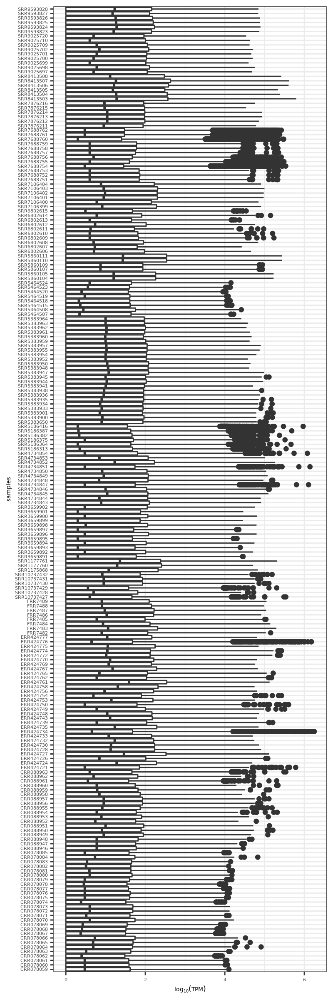

In [67]:
options(repr.plot.width = 4, repr.plot.height = 12, repr.plot.res = 200)
ggplot(logtransform, aes(x=samples, y=log10TPM)) + geom_boxplot() + coord_flip() + ylab(expression(log[10](TPM))) + theme(text = element_text(size = 5))

## 3.2 Plot library size differences

Warning message:
“Column `ID` joining factor and character vector, coercing into character vector”

,ID,dataset,cultivar,instrument,library,gm,growth_condition,intermediate_age,high_level_age,intermediate_tissue,high_level_tissue,n
,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>
1,SRR10737427,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,113089382
2,SRR10737428,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,111510496
3,SRR10737429,cytoplasmic_male_sterility,303-B,Illumina HiSeq 2500,paired,wt,field,Heading,Reproductive,anther,inflorescence,110598657
4,SRR10737430,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,108985218
5,SRR10737431,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,108559410
6,SRR10737432,cytoplasmic_male_sterility,C303A,Illumina HiSeq 2500,paired,mut,field,Heading,Reproductive,anther,inflorescence,108340772


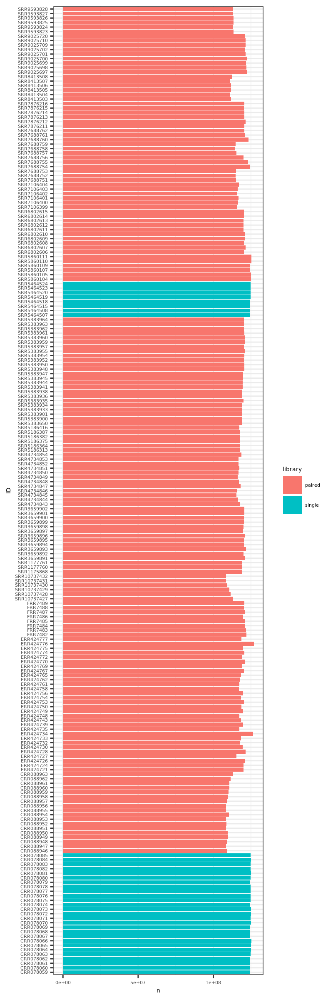

In [69]:
options(repr.plot.width = 4, repr.plot.height = 12, repr.plot.res = 200)
lib <- as.data.frame(length_wheat, stringsAsFactors = FALSE)
libsize <- lib %>% select(-geneid) %>% mutate_each(funs(sum)) %>% slice(1) %>% gather("ID", "n", 1:215)
#libsize$n <- log2(libsize$n)
libsize <- inner_join(wheat_mix_meta, libsize, by = "ID")
head(libsize)
libsize %>% ggplot(aes(x = ID, y = n, fill =library)) + geom_col() + coord_flip() + theme(text = element_text(size = 5))

# 4. Normalization with `DeSeq2`
## 4.1 Variance Stabilization on raw TPM counts
* based on all the exploratory analysis 2(+1) main technical variables are majorly responsible for the clustering of the counts: `dataset`, `library` and `instrument`
* these 3 variables has to go to the design matrix: as their numbering and division borders are the same, `dataset` alone covers for all of them, and including all would cause linearity in the model
* Deseq2 can only take raw counts as input and filtering can be performed before DEG analysis after creating the design
* an example: https://support.bioconductor.org/p/65256/

In [70]:
# important to check whether the order of count matrix columns are the same as the rownames of metadata
all(rownames(wheat_meta) == colnames(hord))

[1] TRUE

#### 2.5.1 Create the design matrix
* to cite DeSeq2: https://workshop.eupathdb.org/bop/pdfs/beginner_DeSeq2.pdf
    The simplest design formula for differential expression would be ∼ condition, where condition is a column in colData(dds) which specifies which of two (or more groups) the samples belong to. For the parathyroid experiment, we will specify ∼ patient + treatment, which means that we want to test for the effect of treatment (the last factor), controlling for the effect of patient (the first factor). You can use R’s formula notation to express any experimental design that can be described within an ANOVA-like framework. Note that DESeq2 uses the same kind of formula as in base R, e.g., for use by the lm function. If the question of interest is whether a fold change due to treatment is different across groups, for example across patients, “interaction terms” can be included using models such as ∼ patient + treatment + patient:treatment. More complex designs such as these are covered in the other DESeq2 vignette.
* source: https://bioconductor.org/packages/release/bioc/vignettes/limma/inst/doc/usersguide.pdf

* **The approach requires one or two matrices to be specified:** The first is the **design matrix** which indicates in effect which RNA samples have been applied to each array. The second is the **contrast matrix** which specifies which comparisons you would like to make between the RNA samples.

* **The philosophy of the approach is as follows:** You have to start by fitting a linear model to your data which fully models the systematic part of your data. The model is specified by the design matrix. Each row of the design matrix corresponds to an array in your experiment and each column corresponds to a coefficient that is used to describe the RNA sources in your experiment. With single-channel data (like RNAseq), you will need as many coefficients as you have distinct RNA sources, no more and no less. Any set of independent coefficients will do, providing they describe all your treatments. The main purpose of this step is to estimate the variability in the data, hence the systematic part needs to be modelled so it can be distinguished from random variation.

* the design should reflect the aim of the differential expression, such as here we want to see whether different tissue types and developmental stages cause a difference in gene expression

* at the same time the design should account for technical variabilites only, should NOT include any biological variation that we are aiming to see

(by including biological variables the normalisation will occur on those differences that we wanted to explore!!)

In [71]:
# dataset in intercept
dds_wheat <- DESeqDataSetFromTximport(hord,
                                   colData = wheat_meta,
                                   design = ~ dataset)
head(counts(dds_wheat))

using counts and average transcript lengths from tximport


,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
TraesCHI1A01G000100,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
TraesCHI1A01G000200,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
TraesCHI1A01G000300,0,0,0,0,0,0,0,0,0,0,⋯,6,8,14,1,0,0,0,0,0,0
TraesCHI1A01G000400,0,0,0,5,5,2,0,0,0,0,⋯,141,109,177,112,2,0,0,0,2,0
TraesCHI1A01G000500,1,8,7,9,2,3,1,8,7,9,⋯,5,11,12,5,1,0,2,0,0,0
TraesCHI1A01G000600,193,2,159,51,9,81,193,2,160,126,⋯,387,513,458,355,0,3,1,4,4,1


In [72]:
dds_wheat <- estimateSizeFactors(dds_wheat)
summary(sizeFactors(dds_wheat))

using 'avgTxLength' from assays(dds), correcting for library size


Length  Class   Mode 
     0   NULL   NULL 

#### 2.5.2 Filter lowly expressed genes for faster computing

In [73]:
# filter out genes that have no reads in any of the experiments
keep <- rowSums(counts(dds_wheat)) > 0
dds_wheat <- dds_wheat[keep,]
# filter out genes where there are less than 2 samples with normalized counts greater than or equal to 0.5
keep <- rowSums(counts(dds_wheat) >= 0.5) >= 2
dds_wheat <- dds_wheat[keep,]
head(dds_wheat)
dim(counts(dds_wheat))
head(counts(dds_wheat))

class: DESeqDataSet 
dim: 6 215 
metadata(1): version
assays(3): counts avgTxLength normalizationFactors
rownames(6): TraesCHI1A01G000100 TraesCHI1A01G000200 ...
  TraesCHI1A01G000500 TraesCHI1A01G000600
rowData names(0):
colnames(215): SRR10737427 SRR10737428 ... SRR5186387 SRR5186416
colData names(22): ID dataset ... instrument library

[1] 120182    215

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
TraesCHI1A01G000100,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
TraesCHI1A01G000200,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
TraesCHI1A01G000300,0,0,0,0,0,0,0,0,0,0,⋯,6,8,14,1,0,0,0,0,0,0
TraesCHI1A01G000400,0,0,0,5,5,2,0,0,0,0,⋯,141,109,177,112,2,0,0,0,2,0
TraesCHI1A01G000500,1,8,7,9,2,3,1,8,7,9,⋯,5,11,12,5,1,0,2,0,0,0
TraesCHI1A01G000600,193,2,159,51,9,81,193,2,160,126,⋯,387,513,458,355,0,3,1,4,4,1


In [ ]:
dds_wheat <- estimateDispersions(dds_wheat)

gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates


In [ ]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 100)
plotDispEsts(dds_wheat)

In [ ]:
setwd("/nfs/pgsb/projects/comparative_triticeae/phenotype/flower_development/refsets/hordeum/")
saveRDS(dds_wheat, file="dds_wheat.rds")

In [ ]:
# this function gives log2 to raw counts
vsd_wheat <- varianceStabilizingTransformation(dds_wheat)
# this function returns matrix with log2transformed counts
vsdMat_wheat <- assay(vsd_wheat)
# solution here: https://www.biostars.org/p/308647/ - drastic filtering is recommended: 
#"You should definitely remove genes that only have zeros (i.e. 100% zeros), 
# and then remove other genes that have a high proportion of zeros (i.e. >50% zeros).
# You can also do the logic another way by removing all genes whose mean raw count across all samples is <-10."

In [ ]:
# according to previous warning message here I filter out genes that are missing in 220 samples or more and missing = TPM <1
idx <- rowSums( counts(dds_wheat) >= 0.5 ) >= 220
dds_wheat_filt <- dds_wheat[idx,]
dim(counts(dds_wheat_filt))
head(dds_wheat_filt)

In [ ]:
dds_wheat_filt <- estimateDispersions(dds_wheat_filt)
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 100)
plotDispEsts(dds_wheat_filt)

In [ ]:
vsd_wheat_filt <- varianceStabilizingTransformation(dds_wheat_filt)
# this function returns matrix with log2transformed counts
vsdMat_wheat_filt <- assay(vsd_wheat_filt)

## 0 at intercept

In [ ]:
# 0 intercept
dds_wheat_zero <- DESeqDataSetFromTximport(hord,
                                   colData = wheat_meta,
                                   design = ~ 0)
head(counts(dds_wheat))

In [ ]:
# figure about why variance stabilization is necessary
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 300)

p1 <- meanSdPlot(as.matrix(cnt_wheat_df[,-1]),plot=F)

logtpm_wide <- logtransform %>% dplyr::select(geneid, samples, log10TPM) %>% spread(samples, log10TPM)
p2 <- meanSdPlot(as.matrix(logtpm_wide[,-1]), plot=F)

p3 <- meanSdPlot(vsdMat_wheat, plot = F)

p4 <- meanSdPlot(vsdMat_wheat_filt, plot = F)

prow <- plot_grid(p1$gg + ggtitle("TPM counts") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 20000, 40000)), 
                  p2$gg + ggtitle("log10(TPM)") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 20000, 40000)), 
                  p3$gg + ggtitle("VS counts") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 20000, 40000)), 
                  p4$gg + ggtitle("VS & filtered counts") + theme(legend.position="none") + scale_x_continuous(breaks =c(0, 6000, 12000)), align = 'vh', hjust = -1, nrow = 1)

legend <- get_legend(p1$gg + theme(legend.box.margin = margin(0, 0, 0, 12)))

plot_grid(prow, legend, rel_widths = c(3, .4))

#cowplot::plot_grid(p1$gg + ggtitle("TPM") + scale_x_continuous(breaks =c(0, 25000, 75000, 125000)), p2$gg + ggtitle("log10(TPM)"), p3$gg + ggtitle("Variance Stabilized counts"), ncol = 3)
# to save as a png
#png("stabilized_counts.png", units="in", width=10, height=4, res=300)
#cowplot::plot_grid(p1$gg + ggtitle("TPM") + scale_x_continuous(breaks =c(0, 25000, 75000, 125000)), p2$gg + ggtitle("log10(TPM)"), p3$gg + ggtitle("Variance Stabilized counts"), ncol = 3)
#dev.off()

# 5. Confirming normalization efficiency with PCAs on vsdMat & log2-transformed counts

In [ ]:
dim(vsdMat_wheat) # this is a matrix with log2 transformed & variance stabilized tpm counts
head(vsdMat_wheat)

In [ ]:
# switching rows to columns
vs <- t(vsdMat_wheat)
vs <- as.data.frame(vs, stringsAsFactors = TRUE)
# adding rownames=ID as a column
vs <- cbind(ID = rownames(vs), vs)
rownames(vs) <- vs$ID
dim(vs)
# include metadata table
vs_meta <- inner_join(wheat_mix_meta, vs, by = "ID")
# add rownames again
rownames(vs_meta) <- vs_meta$ID
# convert variables which are not factor into factor that they could be part of pca
# this part depends on the used metadata-variables
#vs_meta$rna_input<-factor(vs_meta$rna_input)
#vs_meta$batch<-factor(vs_meta$batch)
#class(vs_meta$rna_input)
#class(vs_meta$batch)
# change factor levels where extra levels are present from single dataset: inf_dev & tf_q for dataset, 21 for temp
vs_meta <- droplevels(vs_meta)
# delete ID column to not have it as extra supplementary variable
vs_meta <- select(vs_meta, -ID)
# create classes to check on class types -> pca can handle supplementary variables only as factors!
classes <- sapply(X = vs_meta, FUN = class)
table(classes)
which(classes == 'factor')
dim(vs_meta)
head(vs_meta)

In [ ]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 100)
vs_pca <- PCA(X = vs_meta, scale.unit = FALSE, ncp = 4, quali.sup = c(1:7), graph = F)
#summary(vs_PCA)

In [ ]:
options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 100)
# display eigenvalues
head(vs_pca$eig)
# display scree plot
fviz_eig(vs_pca, addlabels = TRUE)
# display individuals (samples) colored by technical variable
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 100)
colourCount = length(unique(vs_meta$dataset))
getPalette = colorRampPalette(brewer.pal(18, "Paired"))
fviz_pca_ind(X = vs_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(1, 2), habillage = vs_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))
fviz_pca_ind(X = vs_pca, label = "none", legend.title = "Datasets", addEllipses = TRUE, axes = c(3, 4), habillage = vs_meta$dataset) +
                scale_fill_manual(values = getPalette(colourCount))

# 7. Pearson's correlation matrix
* -1 indicates a perfectly negative linear correlation between two variables
* 0 indicates no linear correlation between two variables
* 1 indicates a perfectly positive linear correlation between two variables

In [75]:
wheat_cor <- cor(bcp_filtered, method = c("pearson"))
head(wheat_cor)
min(wheat_cor)
max(wheat_cor)
mean(wheat_cor-(wheat_cor == 1))
median(wheat_cor-(wheat_cor == 1))

,SRR10737427,SRR10737428,SRR10737429,SRR10737430,SRR10737431,SRR10737432,CRR088963,CRR088962,CRR088961,CRR088960,⋯,SRR8413505,SRR8413506,SRR8413507,SRR8413508,SRR5186313,SRR5186364,SRR5186375,SRR5186382,SRR5186387,SRR5186416
SRR10737427,1.0000000,0.4154599,0.9750951,0.7206647,0.2752601,0.6957760,1.0000000,0.4154725,0.9750858,0.9712994,⋯,0.5209678,0.6498499,0.6236166,0.5778184,0.03255545,0.02437015,0.04062690,0.03855178,0.03535221,0.01751481
SRR10737428,0.4154599,1.0000000,0.5387535,0.4190344,0.5931325,0.4619270,0.4154596,1.0000000,0.5387638,0.4089966,⋯,0.2551582,0.2332322,0.2347020,0.2439276,0.06059981,0.04431929,0.06903520,0.06700523,0.04439306,0.02075269
SRR10737429,0.9750951,0.5387535,1.0000000,0.7352383,0.3522922,0.7322203,0.9750948,0.5387629,1.0000000,0.9576155,⋯,0.5117178,0.6232105,0.6017815,0.5593132,0.03745209,0.02784266,0.04576294,0.04378244,0.03729004,0.01799595
SRR10737430,0.7206647,0.4190344,0.7352383,1.0000000,0.8025189,0.9086498,0.7206646,0.4190426,0.7352348,0.7913205,⋯,0.5699157,0.6179869,0.6033407,0.5756650,0.08689957,0.06669031,0.09785510,0.10078891,0.07568615,0.04291088
SRR10737431,0.2752601,0.5931325,0.3522922,0.8025189,1.0000000,0.7683154,0.2752600,0.5931340,0.3522961,0.3774494,⋯,0.3945039,0.3461641,0.3487855,0.3561692,0.10137383,0.07692899,0.11108316,0.11565109,0.07859117,0.04387947
SRR10737432,0.6957760,0.4619270,0.7322203,0.9086498,0.7683154,1.0000000,0.6957757,0.4619339,0.7322217,0.7690117,⋯,0.5123501,0.5555910,0.5451710,0.5189166,0.08533995,0.06831341,0.09284684,0.09859014,0.07496067,0.04713789


[1] 0.000560653

[1] 1

[1] 0.3759848

[1] 0.3317127

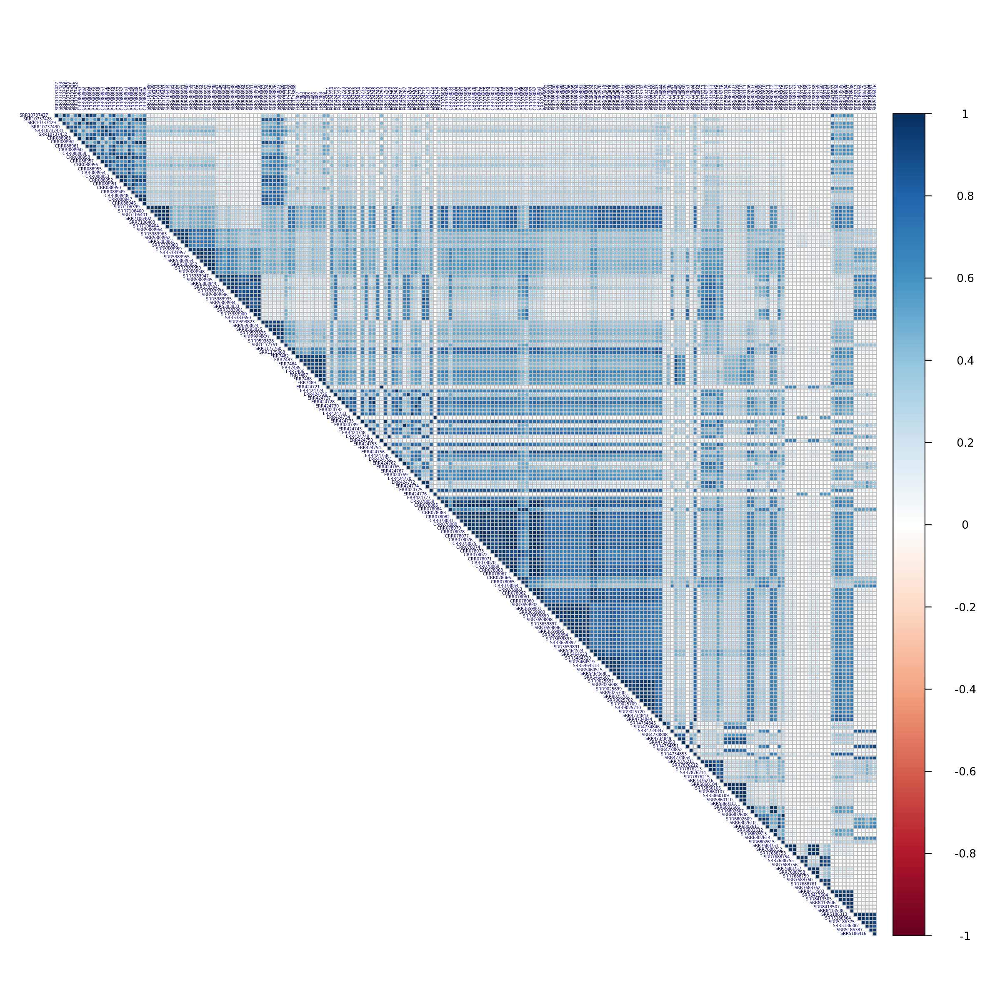

In [76]:
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 200)
corrplot(wheat_cor, tl.cex = 0.3, tl.col = "darkblue", type = "upper")
         #sig.level = 0.05, tl.srt = 75)

# 8. Summarizing comparism figures

Too few points to calculate an ellipse
Too few points to calculate an ellipse
Too few points to calculate an ellipse


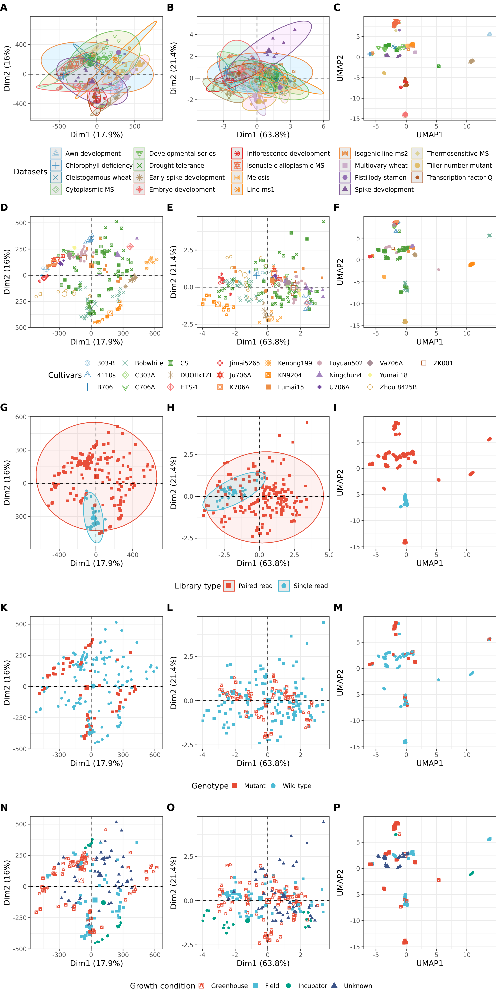

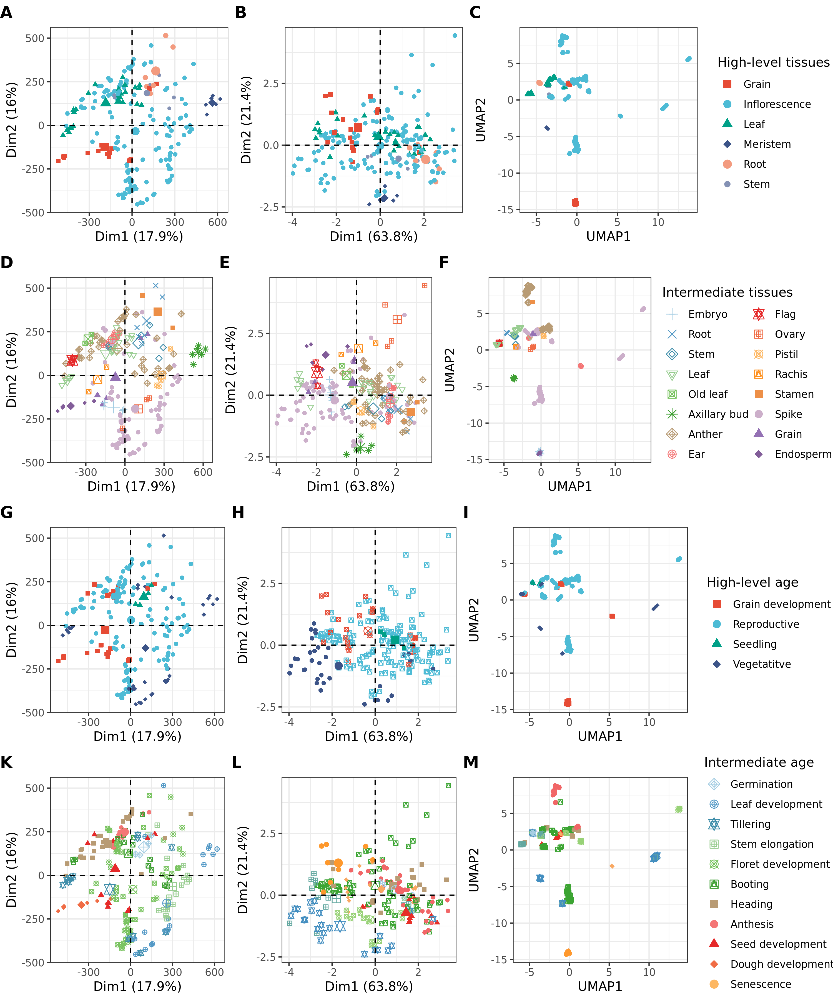

In [177]:
# giant exploratory analysis comparism figures
# here UMAP is on log2&filtered-counts!!!
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")

prow1 <- plot_grid(a1 + theme(legend.position="none"),
                   c1 + theme(legend.position="none"),
                   b1 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(a1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
t1 <- plot_grid(prow1, legend1, nrow = 2, rel_heights = c(3, 1.2))

prow2 <- plot_grid(a2 + theme(legend.position="none"),
                   c2 + theme(legend.position="none"),
                   b2 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend2 <- get_legend(a2 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t2 <- plot_grid(prow2, legend2, nrow = 2, rel_heights = c(3, .5))

prow3 <- plot_grid(a3 + theme(legend.position="none"),
                   c3 + theme(legend.position="none"),
                   b3 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend3 <- get_legend(a3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t3 <- plot_grid(prow3, legend3, nrow = 1, rel_widths = c(3, .6))

prow4 <- plot_grid(a4 + theme(legend.position="none"),
                   c4 + theme(legend.position="none"),
                   b4 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend4 <- get_legend(a4 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t4 <- plot_grid(prow4, legend4, nrow = 1, rel_widths = c(3, .55))

prow5 <- plot_grid(a5 + theme(legend.position="none"),
                   c5 + theme(legend.position="none"),
                   b5 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend5 <- get_legend(a5 + guides(color = guide_legend(ncol = 2)) + theme(legend.position = "right"))
t5 <- plot_grid(prow5, legend5, nrow = 1, rel_widths = c(3, .8))

prow6 <- plot_grid(a6 + theme(legend.position="none"),
                   c6 + theme(legend.position="none"),
                   b6 + theme(legend.position="none"),
                   labels = c( "K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend6 <- get_legend(a6 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t6 <- plot_grid(prow6, legend6, nrow = 1, rel_widths = c(3, .6))


prow7 <- plot_grid(a7 + theme(legend.position="none"),
                   c7 + theme(legend.position="none"),
                   b7 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend7 <- get_legend(a7 + guides(color = guide_legend(nrow = 3)) + theme(legend.position = "bottom"))
t7 <- plot_grid(prow7, legend7, nrow = 2, rel_heights = c(3, 1))

prow8 <- plot_grid(a8 + theme(legend.position="none"),
                   c8 + theme(legend.position="none"),
                   b8 + theme(legend.position="none"),
                   labels = c("K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend8 <- get_legend(a8 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t8 <- plot_grid(prow8, legend8, nrow = 2, rel_heights = c(3, .5))

prow9 <- plot_grid(a9 + theme(legend.position="none"),
                   c9 + theme(legend.position="none"),
                   b9 + theme(legend.position="none"),
                   labels = c( "N", "O", "P"),
                   align = 'vh', hjust = 0, nrow = 1)
legend9 <- get_legend(a9 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t9 <- plot_grid(prow9, legend9, nrow = 2, rel_heights = c(3, .5))

# figures:
# - 1(dataset),7(cultivar),2(library),8(gm),9(growth)
# - 4(high_tissue),5(intermed_tissue),3(high_age),6(intermed_age)

options(repr.plot.width = 10, repr.plot.height = 20, repr.plot.res = 300)
fig1 <- plot_grid(t1, t7, t2, t8, t9, nrow = 5)
fig1

options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)
fig2 <- plot_grid(t4, t5, t3, t6, nrow = 4)
fig2

ggsave("pca_umap1_wheat.pdf", plot = fig1, width = 10, height = 20)
ggsave("pca_umap2_wheat.pdf", plot = fig2, width = 10, height = 12)

Too few points to calculate an ellipse
Too few points to calculate an ellipse
Too few points to calculate an ellipse


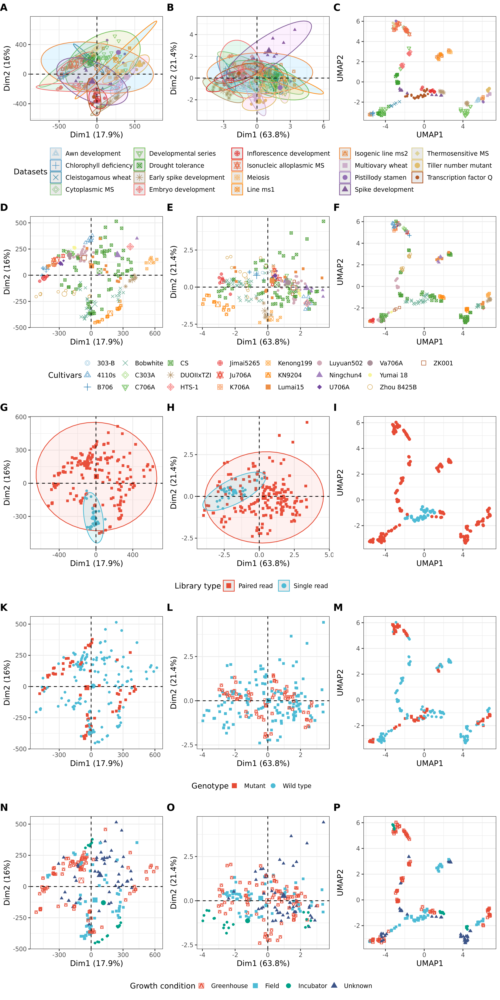

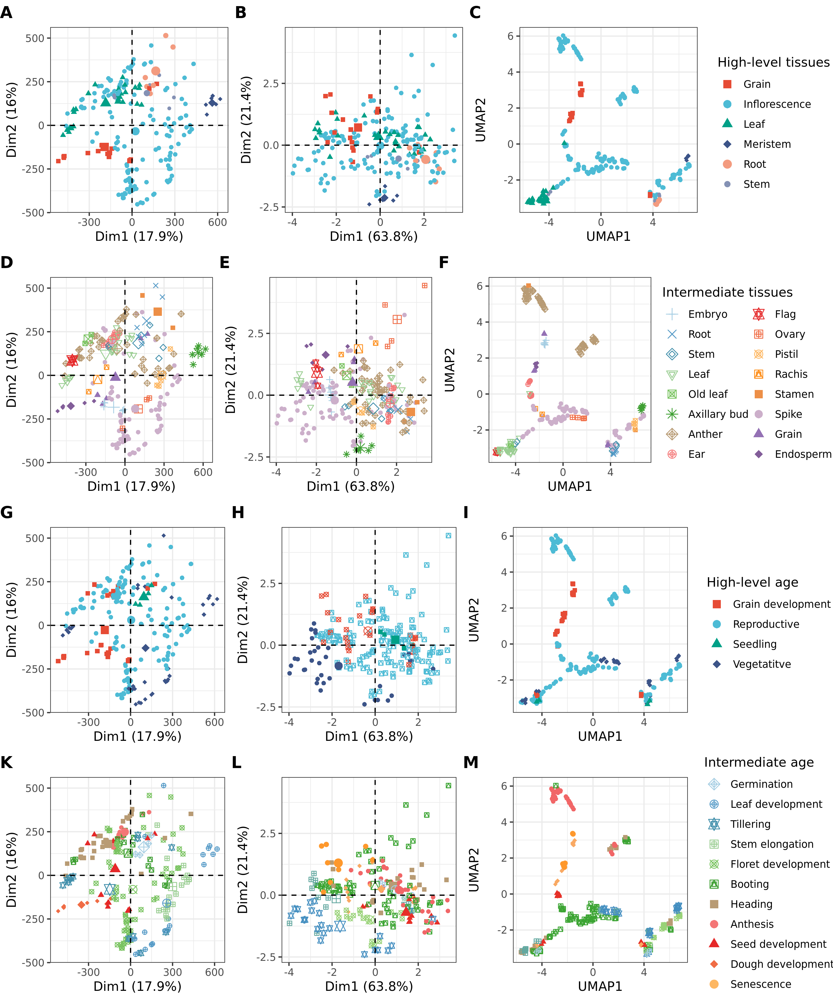

In [178]:
# giant exploratory analysis comparism figures
# here UMAP is on RAW-counts!!!
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")

prow1 <- plot_grid(a1 + theme(legend.position="none"),
                   c1 + theme(legend.position="none"),
                   rb1 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(a1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
t1 <- plot_grid(prow1, legend1, nrow = 2, rel_heights = c(3, 1.2))

prow2 <- plot_grid(a2 + theme(legend.position="none"),
                   c2 + theme(legend.position="none"),
                   rb2 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend2 <- get_legend(a2 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t2 <- plot_grid(prow2, legend2, nrow = 2, rel_heights = c(3, .5))

prow3 <- plot_grid(a3 + theme(legend.position="none"),
                   c3 + theme(legend.position="none"),
                   rb3 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend3 <- get_legend(a3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t3 <- plot_grid(prow3, legend3, nrow = 1, rel_widths = c(3, .6))

prow4 <- plot_grid(a4 + theme(legend.position="none"),
                   c4 + theme(legend.position="none"),
                   rb4 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend4 <- get_legend(a4 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t4 <- plot_grid(prow4, legend4, nrow = 1, rel_widths = c(3, .55))

prow5 <- plot_grid(a5 + theme(legend.position="none"),
                   c5 + theme(legend.position="none"),
                   rb5 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend5 <- get_legend(a5 + guides(color = guide_legend(ncol = 2)) + theme(legend.position = "right"))
t5 <- plot_grid(prow5, legend5, nrow = 1, rel_widths = c(3, .8))

prow6 <- plot_grid(a6 + theme(legend.position="none"),
                   c6 + theme(legend.position="none"),
                   rb6 + theme(legend.position="none"),
                   labels = c( "K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend6 <- get_legend(a6 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t6 <- plot_grid(prow6, legend6, nrow = 1, rel_widths = c(3, .6))


prow7 <- plot_grid(a7 + theme(legend.position="none"),
                   c7 + theme(legend.position="none"),
                   rb7 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend7 <- get_legend(a7 + guides(color = guide_legend(nrow = 3)) + theme(legend.position = "bottom"))
t7 <- plot_grid(prow7, legend7, nrow = 2, rel_heights = c(3, 1))

prow8 <- plot_grid(a8 + theme(legend.position="none"),
                   c8 + theme(legend.position="none"),
                   rb8 + theme(legend.position="none"),
                   labels = c("K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend8 <- get_legend(a8 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t8 <- plot_grid(prow8, legend8, nrow = 2, rel_heights = c(3, .5))

prow9 <- plot_grid(a9 + theme(legend.position="none"),
                   c9 + theme(legend.position="none"),
                   rb9 + theme(legend.position="none"),
                   labels = c( "N", "O", "P"),
                   align = 'vh', hjust = 0, nrow = 1)
legend9 <- get_legend(a9 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t9 <- plot_grid(prow9, legend9, nrow = 2, rel_heights = c(3, .5))

# figures:
# - 1(dataset),7(cultivar),2(library),8(gm),9(growth)
# - 4(high_tissue),5(intermed_tissue),3(high_age),6(intermed_age)

options(repr.plot.width = 10, repr.plot.height = 20, repr.plot.res = 300)
fig1 <- plot_grid(t1, t7, t2, t8, t9, nrow = 5)
fig1

options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)
fig2 <- plot_grid(t4, t5, t3, t6, nrow = 4)
fig2

ggsave("pca_umap1_raw_wheat.pdf", plot = fig1, width = 10, height = 20)
ggsave("pca_umap2_raw_wheat.pdf", plot = fig2, width = 10, height = 12)

Too few points to calculate an ellipse
Too few points to calculate an ellipse
Too few points to calculate an ellipse


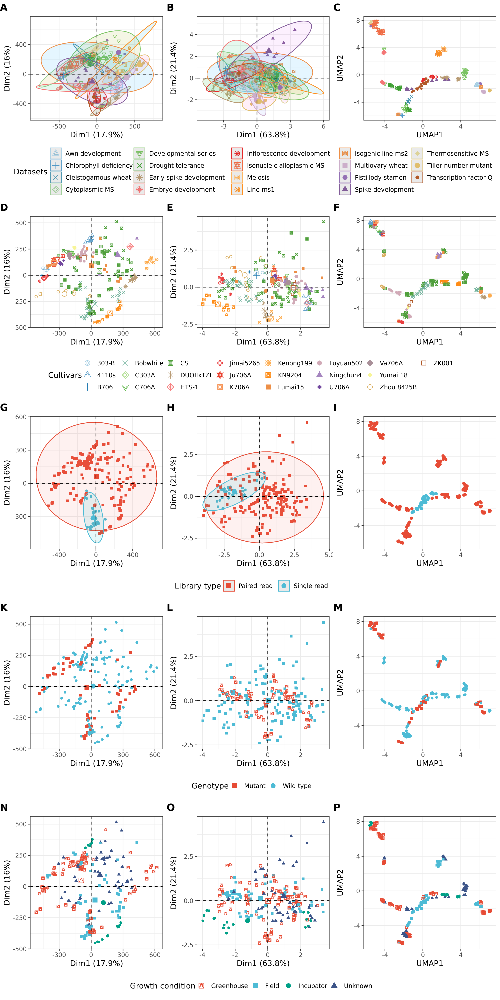

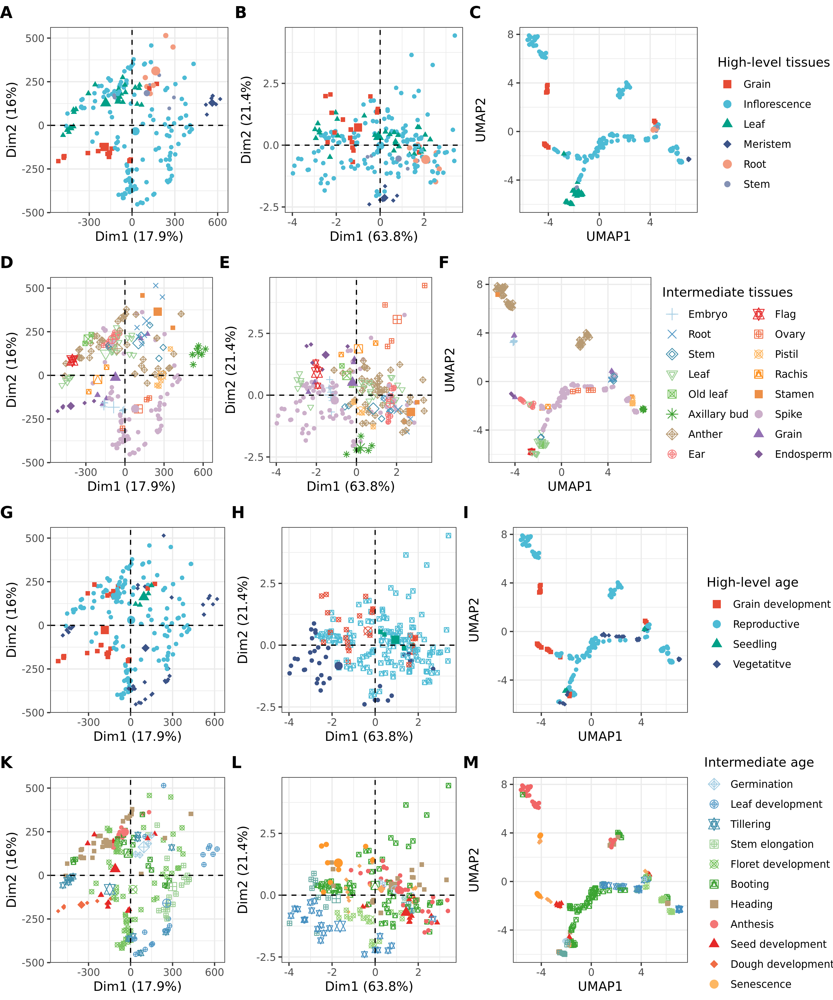

In [180]:
# giant exploratory analysis comparism figures
# here UMAP is on RAW-filtered-counts!!!
setwd("/home/vanda.marosi/floral_development_thesis_vm/figures/")

prow1 <- plot_grid(a1 + theme(legend.position="none"),
                   c1 + theme(legend.position="none"),
                   rfb1 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend1 <- get_legend(a1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
t1 <- plot_grid(prow1, legend1, nrow = 2, rel_heights = c(3, 1.2))

prow2 <- plot_grid(a2 + theme(legend.position="none"),
                   c2 + theme(legend.position="none"),
                   rfb2 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend2 <- get_legend(a2 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t2 <- plot_grid(prow2, legend2, nrow = 2, rel_heights = c(3, .5))

prow3 <- plot_grid(a3 + theme(legend.position="none"),
                   c3 + theme(legend.position="none"),
                   rfb3 + theme(legend.position="none"),
                   labels = c( "G", "H", "I"),
                   align = 'vh', hjust = 0, nrow = 1)
legend3 <- get_legend(a3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t3 <- plot_grid(prow3, legend3, nrow = 1, rel_widths = c(3, .6))

prow4 <- plot_grid(a4 + theme(legend.position="none"),
                   c4 + theme(legend.position="none"),
                   rfb4 + theme(legend.position="none"),
                   labels = c( "A", "B", "C"),
                   align = 'vh', hjust = 0, nrow = 1)
legend4 <- get_legend(a4 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t4 <- plot_grid(prow4, legend4, nrow = 1, rel_widths = c(3, .55))

prow5 <- plot_grid(a5 + theme(legend.position="none"),
                   c5 + theme(legend.position="none"),
                   rfb5 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend5 <- get_legend(a5 + guides(color = guide_legend(ncol = 2)) + theme(legend.position = "right"))
t5 <- plot_grid(prow5, legend5, nrow = 1, rel_widths = c(3, .8))

prow6 <- plot_grid(a6 + theme(legend.position="none"),
                   c6 + theme(legend.position="none"),
                   rfb6 + theme(legend.position="none"),
                   labels = c( "K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend6 <- get_legend(a6 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right"))
t6 <- plot_grid(prow6, legend6, nrow = 1, rel_widths = c(3, .6))


prow7 <- plot_grid(a7 + theme(legend.position="none"),
                   c7 + theme(legend.position="none"),
                   rfb7 + theme(legend.position="none"),
                   labels = c( "D", "E", "F"),
                   align = 'vh', hjust = 0, nrow = 1)
legend7 <- get_legend(a7 + guides(color = guide_legend(nrow = 3)) + theme(legend.position = "bottom"))
t7 <- plot_grid(prow7, legend7, nrow = 2, rel_heights = c(3, 1))

prow8 <- plot_grid(a8 + theme(legend.position="none"),
                   c8 + theme(legend.position="none"),
                   rfb8 + theme(legend.position="none"),
                   labels = c("K", "L", "M"),
                   align = 'vh', hjust = 0, nrow = 1)
legend8 <- get_legend(a8 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t8 <- plot_grid(prow8, legend8, nrow = 2, rel_heights = c(3, .5))

prow9 <- plot_grid(a9 + theme(legend.position="none"),
                   c9 + theme(legend.position="none"),
                   rfb9 + theme(legend.position="none"),
                   labels = c( "N", "O", "P"),
                   align = 'vh', hjust = 0, nrow = 1)
legend9 <- get_legend(a9 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom"))
t9 <- plot_grid(prow9, legend9, nrow = 2, rel_heights = c(3, .5))

# figures:
# - 1(dataset),7(cultivar),2(library),8(gm),9(growth)
# - 4(high_tissue),5(intermed_tissue),3(high_age),6(intermed_age)

options(repr.plot.width = 10, repr.plot.height = 20, repr.plot.res = 300)
fig1 <- plot_grid(t1, t7, t2, t8, t9, nrow = 5)
fig1

options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 300)
fig2 <- plot_grid(t4, t5, t3, t6, nrow = 4)
fig2

ggsave("pca_umap1_raw_filtered_wheat.pdf", plot = fig1, width = 10, height = 20)
ggsave("pca_umap2_raw_filtered_wheat.pdf", plot = fig2, width = 10, height = 12)

In [99]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/vanda.marosi/anaconda3/envs/r/lib/libopenblasp-r0.3.9.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=de_DE.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=de_DE.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=de_DE.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=de_DE.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] patchwork_1.0.1             gdtools_0.2.2              
 [3] corrplot_0.84               viridis_0.5.1              
 [5] viridisLite_0.3.0           svglite_1.2.3.2            
 [7] ggsci_2.9                   umap_0.2.6.0               
 [9] RColorBrewer_1.1-2      